## Defining the MiHI region using a reference FITS file

## Defining the Region of Interest (ROI) with guaranteed reproducibility

In [9]:
from astropy.io import fits 
import sunpy.map as smap
fname = "hmi.m_45s.20180825_091200_TAI.2.magnetogram.fits"
submap = smap.Map(fname)

with fits.open(fname) as hdul:
    hdr=hdul[1].header
    #print(hdr)
print(submap.coordinate_frame)

<Helioprojective Frame (obstime=2018-08-25T09:11:06.000, rsun=696000.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=2018-08-25T09:11:06.000, rsun=696000.0 km): (lon, lat, radius) in (deg, deg, m)
    (0.00251246, 7.03180647, 1.51247847e+11)>)>


/home/daniel/anaconda3/envs/sunpy/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


1. Ángulo theta de rotación calculado: 23.0513 grados



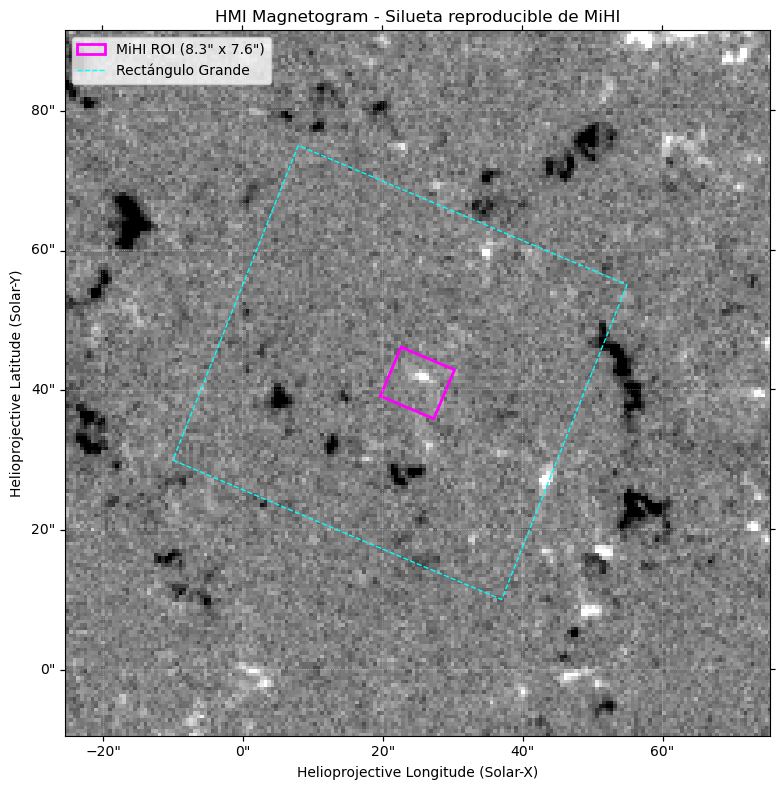

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import sunpy.map as smap
from astropy.coordinates import SkyCoord
import astropy.units as u
from regions import RectangleSkyRegion

# 1. Reference FITS file
fname = "hmi.m_45s.20180825_091200_TAI.2.magnetogram.fits"
submap = smap.Map(fname)
#print(submap)

# 2. Corner coordinates
corners_arcsec = np.array([
    [-10, 30],
    [ 37, 10],
    [ 55, 55],
    [  8, 75]
])

# --- PASO 1: Rotation Angle THETA ---
# Vector del primer lado (de esquina 0 a esquina 1)
delta_x = corners_arcsec[1, 0] - corners_arcsec[0, 0]
delta_y = corners_arcsec[1, 1] - corners_arcsec[0, 1]

# Rotation angle in radianes and degrees
theta_rad_raw = np.arctan2(delta_y, delta_x)
theta_deg_raw = np.degrees(theta_rad_raw)
theta_deg_raw = -theta_deg_raw
print(f"1. Ángulo theta de rotación calculado: {theta_deg_raw:.4f} grados\n")

# --- PASO 2: MiHI Region construction ---
# Define the center, angular size and rotation with respect to the helioprojective coordinates
centro_x = 25.0 * u.arcsec
centro_y = 41.0 * u.arcsec
ancho_arcsec = 8.3 * u.arcsec  # Lado "más horizontal"
alto_arcsec = 7.6 * u.arcsec   # Lado "más vertical"
theta_deg = theta_deg_raw * u.deg

# Creamos el centro en coordenadas físicas del Sol
centro_mihi = SkyCoord(centro_x, centro_y, frame=submap.coordinate_frame)

# Construimos la región en el espacio del cielo (Garantiza reproducibilidad)
mihi_roi_sky = RectangleSkyRegion(
    center=centro_mihi,
    width=ancho_arcsec,
    height=alto_arcsec,
    angle=theta_deg
)

# --- PASO 3: REPRODUCIBILIDAD Y GRAFICADO EN EL FITS ---
# Convertimos la región del cielo a píxeles específicos de ESTE FITS automáticamente
mihi_roi_pixel = mihi_roi_sky.to_pixel(submap.wcs)

# Configuración del gráfico
vmax_MAG = np.percentile(np.abs(submap.data), 99)
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection=submap)

submap.plot(
    axes=ax,
    cmap='gray',
    norm=Normalize(vmin=-vmax_MAG, vmax=vmax_MAG)
)

# Dibujar contorno de la máscara de MiHI usando la región calculada
mihi_roi_pixel.plot(ax=ax, facecolor='none', edgecolor='magenta', linewidth=2, label='MiHI ROI (8.3" x 7.6")')

# Opcional: Dibujar también el rectángulo grande original para verificar que son paralelos
# (Calculando sus píxeles como hacías antes)
corner_coords = SkyCoord(corners_arcsec[:, 0]*u.arcsec, corners_arcsec[:, 1]*u.arcsec, frame=submap.coordinate_frame)
px, py = submap.world_to_pixel(corner_coords)
ax.plot(np.append(px, px[0]), np.append(py, py[0]), color='cyan', linewidth=1, linestyle='--', label='Rectángulo Grande')

# Transformamos el centro a píxeles para saber dónde centrar el zoom visual
cx_pix, cy_pix = submap.world_to_pixel(centro_mihi)
ax.set_xlim(cx_pix.value - 100, cx_pix.value + 100)
ax.set_ylim(cy_pix.value - 100, cy_pix.value + 100)

ax.set_title("HMI Magnetogram - Silueta reproducible de MiHI")
plt.legend(loc='upper left')
plt.tight_layout()
plt.show()

## Define la región ROI

In [4]:
mag_map=submap
from sunpy.coordinates import frames

# 1. ROI: coordenadas Helioprojectivas
centro_mihi_hpc = SkyCoord(
    25*u.arcsec,
    41*u.arcsec,
    frame=mag_map.coordinate_frame
)

# 2. Definir el sistema de destino
carrington_frame = frames.HeliographicCarrington(
    observer=mag_map.observer_coordinate,
    obstime=mag_map.date
)

# 3. AHORA SÍ transformar HPC -> Carrington
centro_mihi_carrington = centro_mihi_hpc.transform_to(
    carrington_frame
)

print(centro_mihi_hpc)
print(centro_mihi_carrington)

<SkyCoord (Helioprojective: obstime=2018-08-25T09:11:06.000, rsun=696000.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=2018-08-25T09:11:06.000, rsun=696000.0 km): (lon, lat, radius) in (deg, deg, m)
    (0.00251246, 7.03180647, 1.51247847e+11)>): (Tx, Ty) in arcsec
    (25., 41.)>
<SkyCoord (HeliographicCarrington: obstime=2018-08-25T09:11:06.000, rsun=696000.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=2018-08-25T09:11:06.000, rsun=696000.0 km): (lon, lat, radius) in (deg, deg, m)
    (0.00251246, 7.03180647, 1.51247847e+11)>): (lon, lat, radius) in (deg, deg, m)
    (106.24203543, 9.49366583, 6.96e+08)>


## Postel

In [5]:
import numpy as np

def carrington_to_postel(lon, lat,
                         lon0=104.89,
                         lat0=7.03):

    # Degrees -> radians
    lon  = np.deg2rad(lon)
    lat  = np.deg2rad(lat)
    lon0 = np.deg2rad(lon0)
    lat0 = np.deg2rad(lat0)

    dlon = lon - lon0

    cos_c = (
        np.sin(lat0) * np.sin(lat)
        + np.cos(lat0) * np.cos(lat) * np.cos(dlon)
    )

    # Numerical protection
    cos_c = np.clip(cos_c, -1, 1)

    c = np.arccos(cos_c)

    # c/sin(c), with limit k=1 at c=0
    if np.ndim(c) == 0:
        k = 1.0 if np.isclose(c, 0) else c / np.sin(c)
    else:
        k = np.ones_like(c)
        mask = ~np.isclose(c, 0)
        k[mask] = c[mask] / np.sin(c[mask])

    x = k * np.cos(lat) * np.sin(dlon)

    y = k * (
        np.cos(lat0) * np.sin(lat)
        - np.sin(lat0) * np.cos(lat) * np.cos(dlon)
    )

    return x, y

In [12]:
def postel_to_pixel(x, y,
                    x0=512.0,
                    y0=512.0,
                    scale=0.0005):

    px = x0 + x / scale
    py = y0 + y / scale

    return px, py

coord_hgc = centro_mihi.transform_to(carrington_frame)

x_postel, y_postel = carrington_to_postel(
    coord_hgc.lon.deg,
    coord_hgc.lat.deg
)

px, py = postel_to_pixel(x_postel, y_postel)

In [19]:
import numpy as np
import astropy.units as u
from astropy.coordinates import SkyCoord
hgc_frame=carrington_frame
# ============================================================
# CONTORNO ROI: HPC → CARRINGTON → POSTEL → PIXEL EGRESIÓN
# ============================================================

N = 100  # puntos por lado

# Propiedades de la ROI que YA definiste
w = mihi_roi_sky.width.to_value(u.arcsec)
h = mihi_roi_sky.height.to_value(u.arcsec)
theta_rad = mihi_roi_sky.angle.to_value(u.rad)

# Coordenadas locales de los cuatro lados del rectángulo
x_local = np.concatenate([
    np.linspace(-w/2,  w/2, N),
    np.full(N,  w/2),
    np.linspace(w/2, -w/2, N),
    np.full(N, -w/2)
])

y_local = np.concatenate([
    np.full(N, -h/2),
    np.linspace(-h/2, h/2, N),
    np.full(N, h/2),
    np.linspace(h/2, -h/2, N)
])

# Rotar el rectángulo
x_rot = (
    x_local*np.cos(theta_rad)
    - y_local*np.sin(theta_rad)
)

y_rot = (
    x_local*np.sin(theta_rad)
    + y_local*np.cos(theta_rad)
)

# Centro de la ROI
center = mihi_roi_sky.center

# Construir el contorno en Helioprojective
roi_hpc = SkyCoord(
    (center.Tx.to_value(u.arcsec) + x_rot) * u.arcsec,
    (center.Ty.to_value(u.arcsec) + y_rot) * u.arcsec,
    frame=mag_map.coordinate_frame
)

# ============================================================
# HPC → CARRINGTON
# ============================================================

roi_hgc = roi_hpc.transform_to(hgc_frame)

# ============================================================
# CARRINGTON → POSTEL
# ============================================================

x_roi_postel, y_roi_postel = carrington_to_postel(
    roi_hgc.lon.deg,
    roi_hgc.lat.deg
)

# ============================================================
# POSTEL → PIXEL
# ============================================================

px_roi, py_roi = postel_to_pixel(
    x_roi_postel,
    y_roi_postel
)

print("ROI calculada correctamente")
print(f"x: {px_roi.min():.2f} → {px_roi.max():.2f}")
print(f"y: {py_roi.min():.2f} → {py_roi.max():.2f}")

ROI calculada correctamente
x: 547.43 → 569.70
y: 587.32 → 608.83


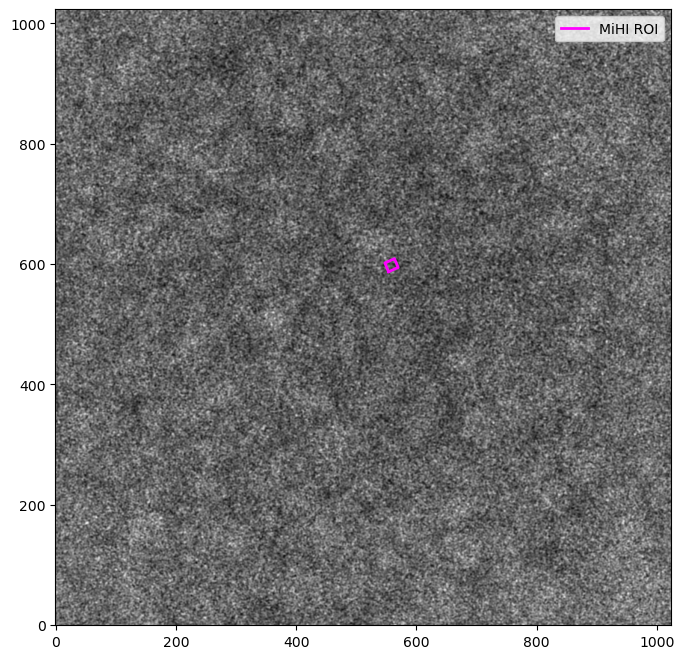

In [20]:
from astropy.io import fits
import matplotlib.pyplot as plt

egression_file = '../data/2018_08_25/egress_pwr_06.0-07.0mHz_z0000km.fits'

# Abrir los datos
with fits.open(egression_file) as hdul:
    egression_data = hdul[0].data

# Graficar
fig, ax = plt.subplots(figsize=(8, 8))

ax.imshow(
    egression_data,
    origin="lower",
    cmap="gray"
)

ax.plot(
    px_roi,
    py_roi,
    color="magenta",
    linewidth=2,
    label="MiHI ROI"
)

ax.legend()
plt.show()

In [3]:
from astropy.io import fits
with fits.open(fname) as hdul_ref:
    fits_de_referencia = hdul_ref[0].data  # Esto carga la matriz 3D en memoria [frame, y, x]
    hdr=hdul_ref[1].header
    #print(hdr)
    DATE_OBS=hdr['DATE-OBS']

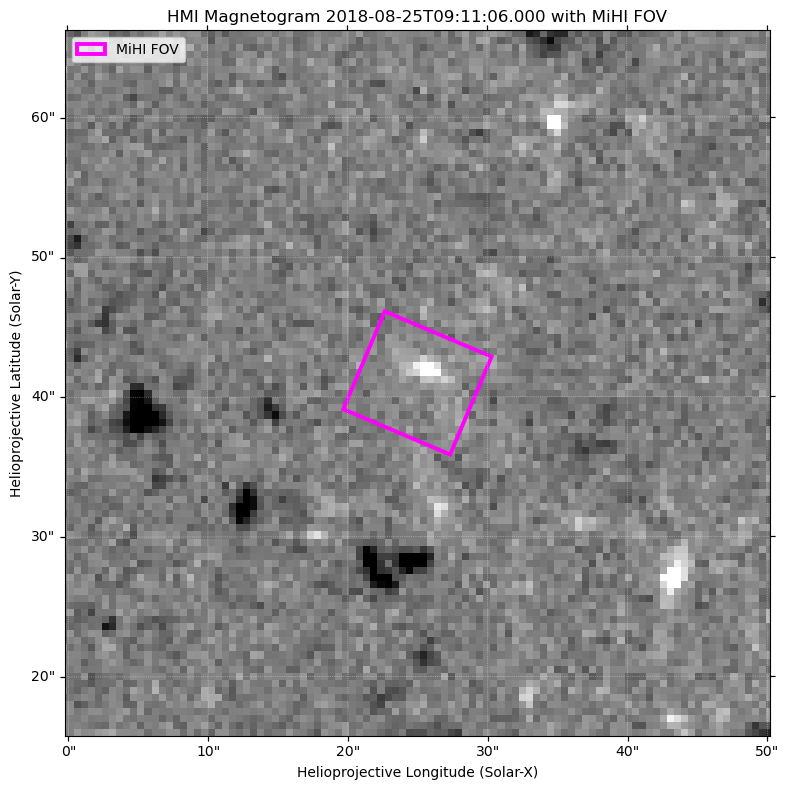

In [6]:
from astropy.io import fits

# =========================================================================
# NUEVA CELDA: GRAFICAR UN FRAME DEL CUBO UTILIZANDO LA MISMA GEOMETRÍA
# =========================================================================

# 1. Abrir el cubo de datos y extraer un frame (por ejemplo, el índice 0)
indice_frame = 115

with fits.open('MAG_cube.fits') as hdul:
    cubo_datos = hdul[0].data  # Esto carga la matriz 3D en memoria [frame, y, x]
    hdr=hdul[0].header
# Extraemos la rebanada 2D del frame que te interesa inspeccionar
datos_frame_2d = cubo_datos[indice_frame, :, :]

# 2. Generar el nuevo mapa de SunPy usando tus datos del cubo 
# pero inyectándole los metadatos perfectos del 'submap' original
mapa_frame_cubo = smap.Map(datos_frame_2d, submap.meta)

# 3. Convertir tu región del cielo ('mihi_roi_sky') a los píxeles de este nuevo mapa
mihi_roi_pixel_cubo = mihi_roi_sky.to_pixel(mapa_frame_cubo.wcs)

# 4. Configurar el gráfico independiente del frame
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection=mapa_frame_cubo)

# Escalamos el contraste del magnetograma del cubo usando tu normalización simétrica
vmax_MAG_cubo = np.nanpercentile(np.abs(mapa_frame_cubo.data), 99)

mapa_frame_cubo.plot(
    axes=ax,
    cmap='gray',
    norm=Normalize(vmin=-vmax_MAG_cubo, vmax=vmax_MAG_cubo)
)

# 5. Pintar la misma silueta magenta de la región MiHI
mihi_roi_pixel_cubo.plot(
    ax=ax, 
    facecolor='none', 
    edgecolor='magenta', 
    linewidth=2.8, 
    label='MiHI FOV'
)

# 6. Reutilizar las mismas coordenadas de píxel centrales de tu celda anterior para el zoom
ax.set_xlim(cx_pix.value - 50, cx_pix.value + 50)
ax.set_ylim(cy_pix.value - 50, cy_pix.value + 50)

ax.set_title(f"HMI Magnetogram {DATE_OBS} with MiHI FOV")
plt.legend(loc='upper left')
plt.tight_layout()
plt.savefig('HMI-MiHIFOV.png')
plt.show()

In [5]:
import numpy as np

# 1. Definir los parámetros geométricos base
cx, cy = 25.0, 41.0
w, h = 8.3, 7.6

# Convertir el ángulo a radianes para las funciones de NumPy
rad = np.radians(theta_deg)

# 2. Desplazamientos (deltas) de las 4 esquinas antes de rotar (locales al centro)
# El orden estándar es: [Inf Der, Sup Der, Sup Izq, Inf Izq]
dx = np.array([ w/2,  w/2, -w/2, -w/2])
dy = np.array([-h/2,  h/2,  h/2, -h/2])

# 3. Aplicar la matriz de rotación e incorporar las coordenadas del centro
x_esquinas = cx + dx * np.cos(rad) - dy * np.sin(rad)
y_esquinas = cy + dx * np.sin(rad) + dy * np.cos(rad)

# 4. Mostrar los resultados de cada esquina
nombres = [
    "Esquina Inferior Derecha", 
    "Esquina Superior Derecha", 
    "Esquina Superior Izquierda", 
    "Esquina Inferior Izquierda"
]

print(f"--- Coordenadas de las esquinas (Rotación: {theta_deg}°) ---\n")
for i in range(4):
    print(f"{nombres[i]}:")
    print(f"  X = {x_esquinas[i]:.4f}")
    print(f"  Y = {y_esquinas[i]:.4f}\n")

--- Coordenadas de las esquinas (Rotación: 23.051300916473025 deg°) ---

Esquina Inferior Derecha:
  X = 30.3066
  Y = 39.1284

Esquina Superior Derecha:
  X = 27.3307
  Y = 46.1215

Esquina Superior Izquierda:
  X = 19.6934
  Y = 42.8716

Esquina Inferior Izquierda:
  X = 22.6693
  Y = 35.8785



Forma de time_distance: (355, 250)


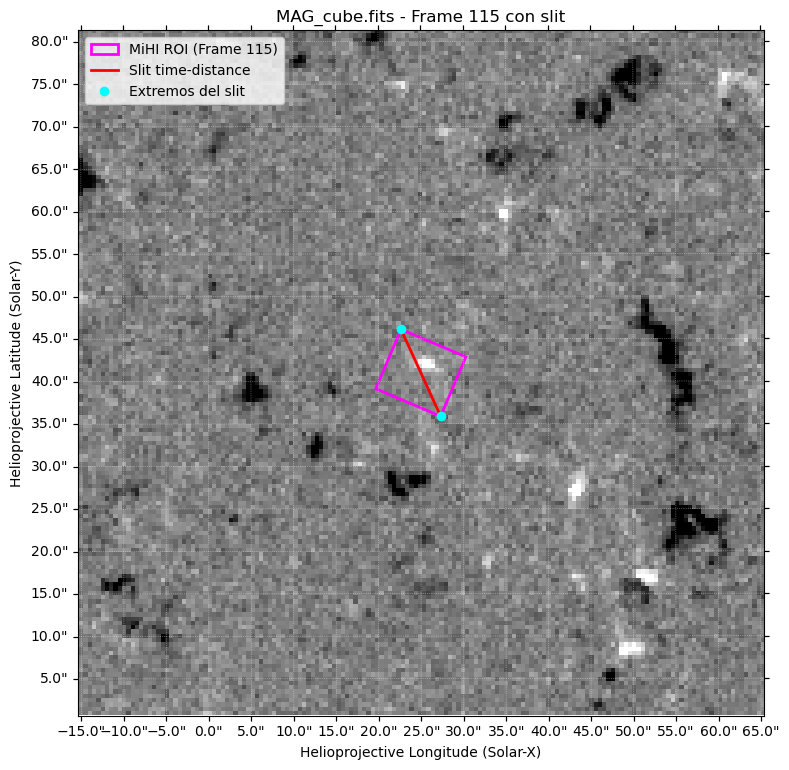

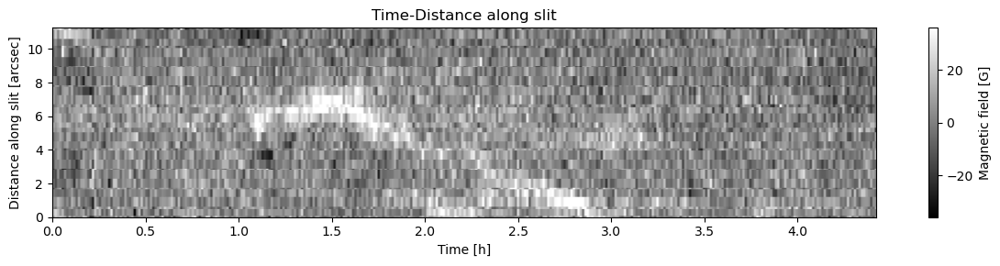

In [6]:
# =========================================================================
# SLIT EN ARCSEC + OVERPLOT EN EL MAPA + TIME-DISTANCE EN ARCSEC
# =========================================================================

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import astropy.units as u
from astropy.coordinates import SkyCoord

# -------------------------------------------------------------------------
# 0. Supuestos:
#    - cubo_datos tiene forma (N_frames, ny, nx)
#    - indice_frame ya está definido
#    - submap.meta viene del mapa de referencia con la geometría correcta
#    - mihi_roi_sky ya existe y está en coordenadas de cielo
# -------------------------------------------------------------------------

# -------------------------------------------------------------------------
# 1. Construir el mapa SunPy del frame del cubo
# -------------------------------------------------------------------------
datos_frame_2d = cubo_datos[indice_frame, :, :]
mapa_frame_cubo = smap.Map(datos_frame_2d, submap.meta)

# ROI en píxeles del mapa del cubo, solo para visualizar la región
mihi_roi_pixel_cubo = mihi_roi_sky.to_pixel(mapa_frame_cubo.wcs)

# -------------------------------------------------------------------------
# 2. Definir los extremos del slit en ARCSEC
# -------------------------------------------------------------------------
x0_arc, y0_arc = 27.3307, 35.8785   # Esquina Inferior Derecha
x1_arc, y1_arc = 22.6693, 46.1215   # Esquina Superior Izquierda

# Número de puntos a lo largo del slit
# Puedes aumentarlo si quieres sampleo más fino
n_points = 250

x_line_arc = np.linspace(x0_arc, x1_arc, n_points) * u.arcsec
y_line_arc = np.linspace(y0_arc, y1_arc, n_points) * u.arcsec

# SkyCoord del slit en el frame del mapa
slit_sky_coords = SkyCoord(
    x_line_arc,
    y_line_arc,
    frame=mapa_frame_cubo.coordinate_frame
)

# -------------------------------------------------------------------------
# 3. Convertir el slit a píxeles para samplear el cubo
# -------------------------------------------------------------------------
slit_x_pix, slit_y_pix = mapa_frame_cubo.world_to_pixel(slit_sky_coords)

j_slit = np.round(slit_x_pix.to_value(u.pixel)).astype(int)  # eje X
i_slit = np.round(slit_y_pix.to_value(u.pixel)).astype(int)  # eje Y

# Limitar a los bordes del cubo
N_frames, ny, nx = cubo_datos.shape
j_slit = np.clip(j_slit, 0, nx - 1)
i_slit = np.clip(i_slit, 0, ny - 1)

# -------------------------------------------------------------------------
# 4. Distancia espacial a lo largo del slit en ARCSEC
#    Como el slit es recto en el plano del cielo, usamos distancia euclidiana
# -------------------------------------------------------------------------
dist_along_slit_arcsec = np.sqrt(
    (x_line_arc.to_value(u.arcsec) - x_line_arc[0].to_value(u.arcsec))**2 +
    (y_line_arc.to_value(u.arcsec) - y_line_arc[0].to_value(u.arcsec))**2
)

# -------------------------------------------------------------------------
# 5. Extraer el time-distance a lo largo del slit
# -------------------------------------------------------------------------
time_distance = np.empty((N_frames, n_points), dtype=np.float32)

for k in range(N_frames):
    frame = cubo_datos[k]
    time_distance[k, :] = frame[i_slit, j_slit]

print("Forma de time_distance:", time_distance.shape)

# -------------------------------------------------------------------------
# 6. Graficar el frame con la ROI y el slit
# -------------------------------------------------------------------------
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection=mapa_frame_cubo)

vmax_MAG_cubo = np.nanpercentile(np.abs(mapa_frame_cubo.data), 99)

mapa_frame_cubo.plot(
    axes=ax,
    cmap='gray',
    norm=Normalize(vmin=-vmax_MAG_cubo, vmax=vmax_MAG_cubo)
)

# Región MiHI en magenta
mihi_roi_pixel_cubo.plot(
    ax=ax,
    facecolor='none',
    edgecolor='magenta',
    linewidth=2,
    label=f'MiHI ROI (Frame {indice_frame})'
)

# Slit en rojo, directamente en coordenadas del cielo
ax.plot_coord(
    slit_sky_coords,
    color='red',
    linewidth=2,
    label='Slit time-distance'
)

# Marcar también los extremos del slit
extremos_slit = SkyCoord(
    [x0_arc, x1_arc] * u.arcsec,
    [y0_arc, y1_arc] * u.arcsec,
    frame=mapa_frame_cubo.coordinate_frame
)

ax.plot_coord(
    extremos_slit,
    'o',
    color='cyan',
    markersize=6,
    label='Extremos del slit'
)

# =========================================================================
# CONTROL EXPLICÍTICO DE TICKS PARA SUNPY / WCSAXES
# =========================================================================
# Opción A: Configurar un espacio fijo entre ticks (ej. cada 2 arcosegundos)
ax.coords[0].set_ticks(spacing=5.0 * u.arcsec)  # Eje X (Tx / RA)
ax.coords[1].set_ticks(spacing=5.0 * u.arcsec)  # Eje Y (Ty / Dec)

# Opción B (Si la Opción A satura la gráfica): Forzar un número aproximado de ticks
# ax.coords[0].set_ticks(number=8) 
# ax.coords[1].set_ticks(number=8)

# Asegurar que el formato de los números se muestre de forma limpia
ax.coords[0].set_major_formatter('s.s')  # Formato en segundos de arco
ax.coords[1].set_major_formatter('s.s')
# =========================================================================

ax.set_xlim(cx_pix.value - 80, cx_pix.value + 80)
ax.set_ylim(cy_pix.value - 80, cy_pix.value + 80)
ax.set_title(f"MAG_cube.fits - Frame {indice_frame} con slit")
plt.legend(loc='upper left')
plt.tight_layout()
plt.show()

# -------------------------------------------------------------------------
# 7. Graficar el mapa time-distance con eje espacial en ARCSEC
# -------------------------------------------------------------------------
# Ajusta esto al cadence real de tu cubo
dt_seconds = 45.0

tiempo_horas = np.arange(N_frames) * dt_seconds / 3600.0

fig, ax = plt.subplots(figsize=(12, 3))

vmax_td = np.nanpercentile(np.abs(time_distance), 99.0)

im_td = ax.imshow(
    time_distance.T,
    origin='lower',
    aspect='auto',
    cmap='gray',
    norm=Normalize(vmin=-vmax_td, vmax=vmax_td),
    extent=(
        tiempo_horas[0],
        tiempo_horas[-1],
        dist_along_slit_arcsec[0],
        dist_along_slit_arcsec[-1]
    )
)

ax.set_xlabel("Time [h]")
ax.set_ylabel("Distance along slit [arcsec]")
ax.set_title("Time-Distance along slit")

cbar = plt.colorbar(im_td, ax=ax)
cbar.set_label("Magnetic field [G]")

plt.tight_layout()
plt.show()

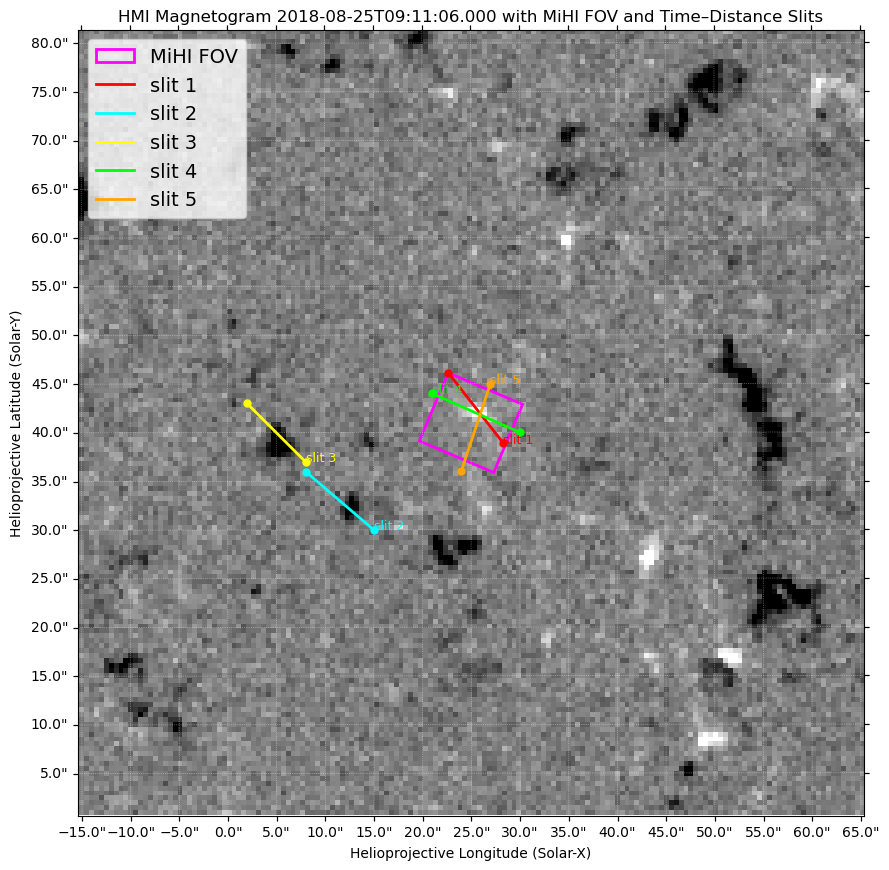

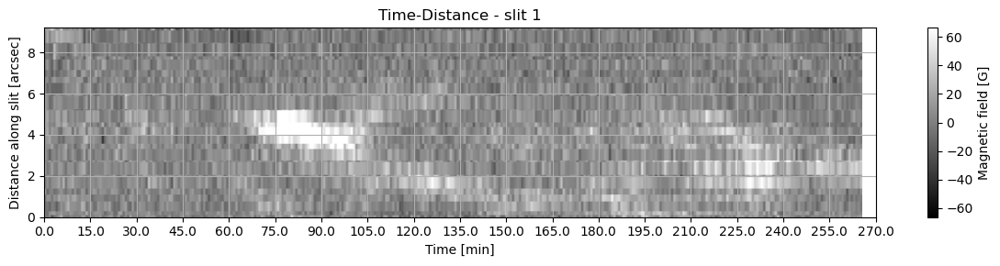

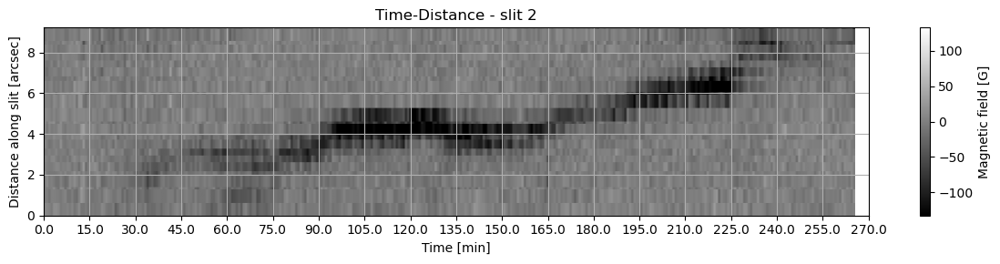

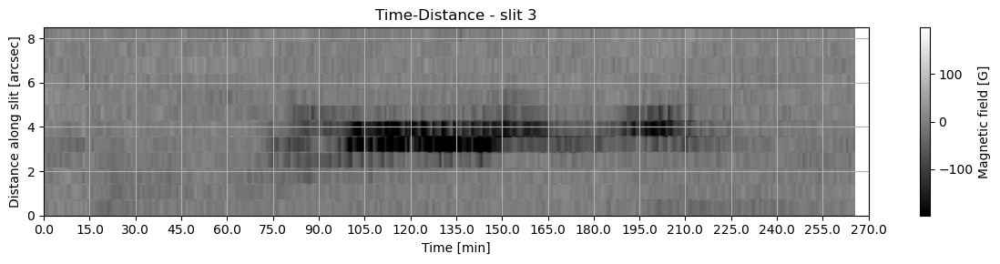

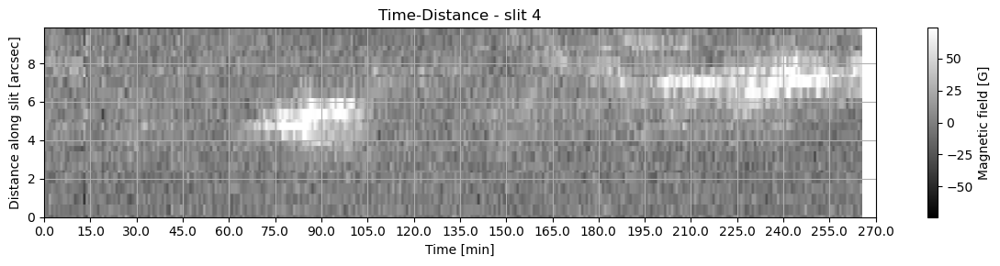

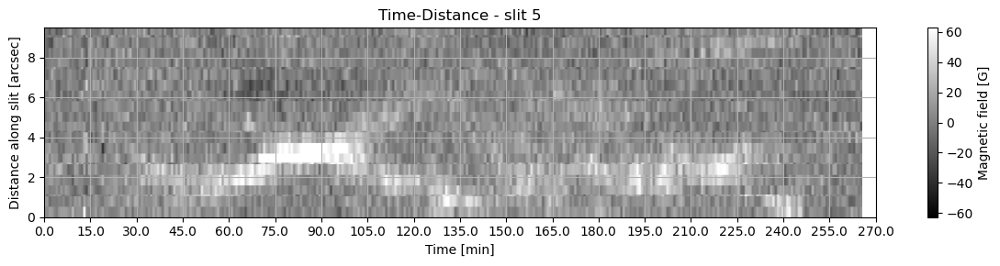

Figuras guardadas en: output_time_distance
slit 1: (28.3307, 38.8785) -> (22.6693, 46.1215)
slit 2: (15.0, 30.0) -> (8.0, 36.0)
slit 3: (8.0, 37.0) -> (2.0, 43.0)
slit 4: (21.0, 44.0) -> (30.0, 40.0)
slit 5: (27.0, 45.0) -> (24.0, 36.0)


In [7]:
# =========================================================================
# MULTI-SLIT: MAPA GENERAL + 5 TIME-DISTANCE + GUARDADO DE FIGURAS
# =========================================================================

import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import astropy.units as u
from astropy.coordinates import SkyCoord

# -------------------------------------------------------------------------
# 0. Carpeta de salida para guardar figuras
# -------------------------------------------------------------------------
output_dir = "output_time_distance"
os.makedirs(output_dir, exist_ok=True)

# -------------------------------------------------------------------------
# 1. Construir el mapa SunPy del frame del cubo
# -------------------------------------------------------------------------
datos_frame_2d = cubo_datos[indice_frame, :, :]
mapa_frame_cubo = smap.Map(datos_frame_2d, submap.meta)

# ROI en píxeles del mapa del cubo, solo para visualizar la región
mihi_roi_pixel_cubo = mihi_roi_sky.to_pixel(mapa_frame_cubo.wcs)

# -------------------------------------------------------------------------
# 2. Definir TODOS los slits
#    Incluyo primero el slit original de tu código como slit0_original
# -------------------------------------------------------------------------
slits = [
    {
        "label": "slit 1",
        "x0": 28.3307, "y0": 38.8785,
        "x1": 22.6693, "y1": 46.1215,
        "color": "red"
    },
    {
        "label": "slit 2",
        "x0": 15.0, "y0": 30.0,
        "x1": 8.0,  "y1": 36.0,
        "color": "cyan"
    },
    {
        "label": "slit 3",
        "x0": 8.0,  "y0": 37.0,
        "x1": 2.0,  "y1": 43.0,
        "color": "yellow"
    },
    {
        "label": "slit 4",
        "x0": 21.0, "y0": 44.0,
        "x1": 30.0, "y1": 40.0,
        "color": "lime"
    },
    {
        "label": "slit 5",
        "x0": 27.0, "y0": 45.0,
        "x1": 24.0, "y1": 36.0,
        "color": "orange"
    },
]

# Número de puntos por slit
n_points = 250

# Cadencia temporal
dt_seconds = 45.0

# Dimensiones del cubo
N_frames, ny, nx = cubo_datos.shape
tiempo_horas = np.arange(N_frames) * dt_seconds / 60.0

# Guardaremos resultados aquí
resultados_slits = []

# -------------------------------------------------------------------------
# 3. Procesar cada slit: coordenadas cielo -> píxeles -> time-distance
# -------------------------------------------------------------------------
for slit in slits:
    x0_arc, y0_arc = slit["x0"], slit["y0"]
    x1_arc, y1_arc = slit["x1"], slit["y1"]

    x_line_arc = np.linspace(x0_arc, x1_arc, n_points) * u.arcsec
    y_line_arc = np.linspace(y0_arc, y1_arc, n_points) * u.arcsec

    slit_sky_coords = SkyCoord(
        x_line_arc,
        y_line_arc,
        frame=mapa_frame_cubo.coordinate_frame
    )

    slit_x_pix, slit_y_pix = mapa_frame_cubo.world_to_pixel(slit_sky_coords)

    j_slit = np.round(slit_x_pix.to_value(u.pixel)).astype(int)
    i_slit = np.round(slit_y_pix.to_value(u.pixel)).astype(int)

    j_slit = np.clip(j_slit, 0, nx - 1)
    i_slit = np.clip(i_slit, 0, ny - 1)

    dist_along_slit_arcsec = np.sqrt(
        (x_line_arc.to_value(u.arcsec) - x_line_arc[0].to_value(u.arcsec))**2 +
        (y_line_arc.to_value(u.arcsec) - y_line_arc[0].to_value(u.arcsec))**2
    )

    time_distance = np.empty((N_frames, n_points), dtype=np.float32)

    for k in range(N_frames):
        frame = cubo_datos[k]
        time_distance[k, :] = frame[i_slit, j_slit]

    resultados_slits.append({
        "label": slit["label"],
        "color": slit["color"],
        "x0": x0_arc, "y0": y0_arc,
        "x1": x1_arc, "y1": y1_arc,
        "skycoords": slit_sky_coords,
        "dist_arcsec": dist_along_slit_arcsec,
        "time_distance": time_distance
    })

# -------------------------------------------------------------------------
# 4. Graficar mapa general con los 5 slits superpuestos
# -------------------------------------------------------------------------
fig_map = plt.figure(figsize=(9, 9))
ax_map = fig_map.add_subplot(111, projection=mapa_frame_cubo)

vmax_MAG_cubo = np.nanpercentile(np.abs(mapa_frame_cubo.data), 99)

mapa_frame_cubo.plot(
    axes=ax_map,
    cmap='gray',
    norm=Normalize(vmin=-vmax_MAG_cubo, vmax=vmax_MAG_cubo)
)

# ROI en magenta
mihi_roi_pixel_cubo.plot(
    ax=ax_map,
    facecolor='none',
    edgecolor='magenta',
    linewidth=2,
    label=f'MiHI FOV'
)

# Dibujar todos los slits
for res in resultados_slits:
    ax_map.plot_coord(
        res["skycoords"],
        color=res["color"],
        linewidth=2,
        label=res["label"]
    )

    extremos_slit = SkyCoord(
        [res["x0"], res["x1"]] * u.arcsec,
        [res["y0"], res["y1"]] * u.arcsec,
        frame=mapa_frame_cubo.coordinate_frame
    )

    ax_map.plot_coord(
        extremos_slit,
        'o',
        color=res["color"],
        markersize=5
    )

    # Etiqueta cerca del primer extremo
    ax_map.text_coord(
        SkyCoord(res["x0"] * u.arcsec, res["y0"] * u.arcsec,
                 frame=mapa_frame_cubo.coordinate_frame),
        res["label"],
        color=res["color"],
        fontsize=9
    )

# Ticks WCS
ax_map.coords[0].set_ticks(spacing=5.0 * u.arcsec)
ax_map.coords[1].set_ticks(spacing=5.0 * u.arcsec)
ax_map.coords[0].set_major_formatter('s.s')
ax_map.coords[1].set_major_formatter('s.s')
#ax_map.legend(fontsize=19)

# Mismo zoom que tu ejemplo
ax_map.set_xlim(cx_pix.value - 80, cx_pix.value + 80)
ax_map.set_ylim(cy_pix.value - 80, cy_pix.value + 80)

ax_map.set_title(f"HMI Magnetogram {DATE_OBS} with MiHI FOV and Time–Distance Slits") # TITULO DEL MAGNETOGRAMA CON LOS SLITS
plt.legend(loc='upper left', fontsize=14)
plt.tight_layout()

map_filename = os.path.join(output_dir, "mapa_general_5_slits.png")
fig_map.savefig(map_filename, dpi=200, bbox_inches="tight")
plt.show()

# -------------------------------------------------------------------------
# 5. Graficar y guardar un time-distance por cada slit
# -------------------------------------------------------------------------
for res in resultados_slits:
    fig_td, ax_td = plt.subplots(figsize=(12, 3))

    td = res["time_distance"]
    dist_arcsec = res["dist_arcsec"]

    vmax_td = np.nanpercentile(np.abs(td), 99.0)

    im_td = ax_td.imshow(
        td.T,
        origin='lower',
        aspect='auto',
        cmap='gray',
        norm=Normalize(vmin=-vmax_td, vmax=vmax_td),
        extent=(
            tiempo_horas[0],
            tiempo_horas[-1],
            dist_arcsec[0],
            dist_arcsec[-1]
        )
    )
    
    ax_td.set_xlim(0, 200)
    ax_td.set_xlabel("Time [h]")
    ax_td.set_ylabel("Distance along slit [arcsec]")
    ax_td.set_title(f"Time-Distance - {res['label']}")

        # Más ticks horizontales (por ejemplo, cada 10 minutos)
    # tiempo_horas está en minutos ahora (dividiste por 60)
    tick_step_min = 15.0
    t_min = tiempo_horas[0]
    t_max = tiempo_horas[-1]
    
    time_ticks = np.arange(t_min, t_max + tick_step_min, tick_step_min)
    
    ax_td.set_xticks(time_ticks)
    ax_td.set_xticklabels(
        np.round(time_ticks, 1)  # o formateo con f-strings si quieres
    )
    ax_td.set_xlabel("Time [min]")  # ya que dividiste por 60
    
    cbar = plt.colorbar(im_td, ax=ax_td)
    cbar.set_label("Magnetic field [G]")

    plt.tight_layout()

    td_filename = os.path.join(output_dir, f"TD_{res['label']}.png")
    fig_td.savefig(td_filename, dpi=200, bbox_inches="tight")
    plt.grid()
    plt.show()

# -------------------------------------------------------------------------
# 6. (Opcional) imprimir resumen para identificar cada slit
# -------------------------------------------------------------------------
print("Figuras guardadas en:", output_dir)
for res in resultados_slits:
    print(
        f"{res['label']}: "
        f"({res['x0']}, {res['y0']}) -> ({res['x1']}, {res['y1']})"
    )

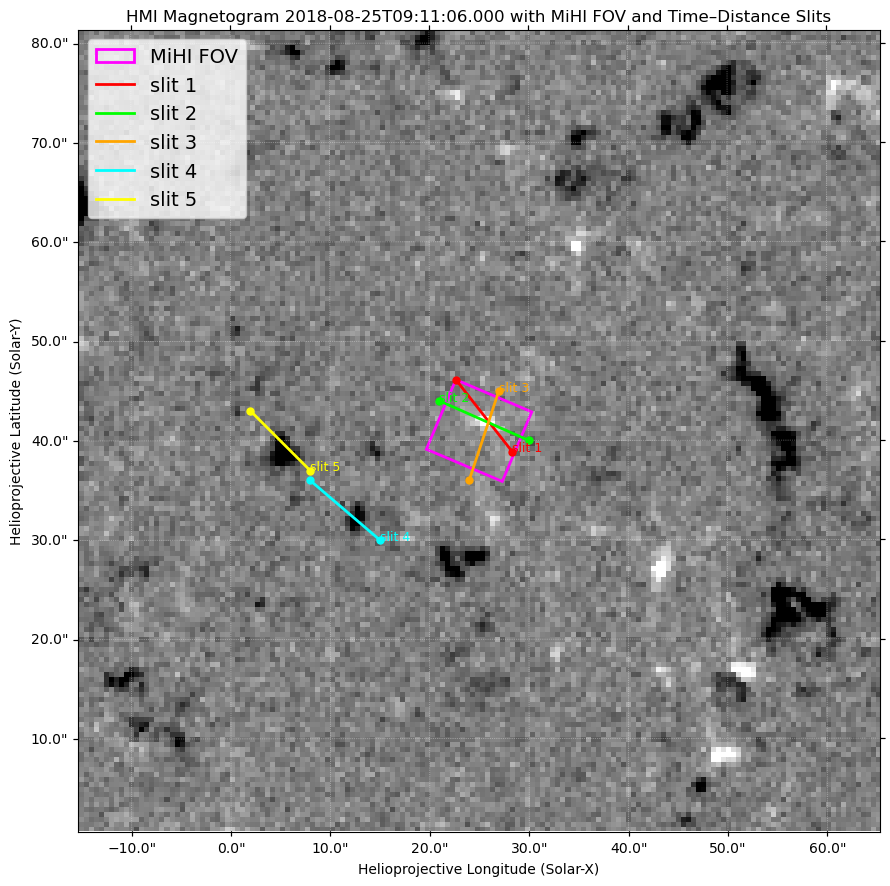

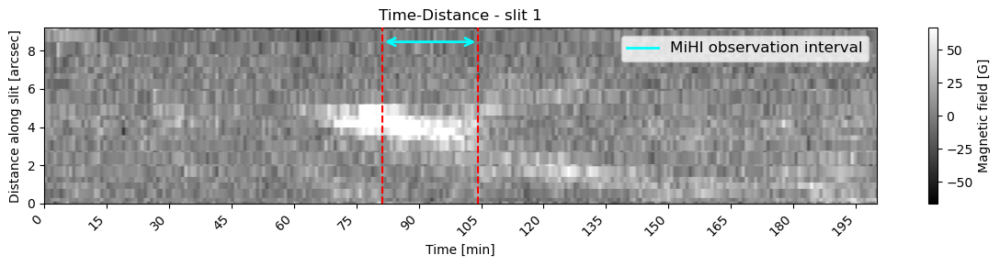

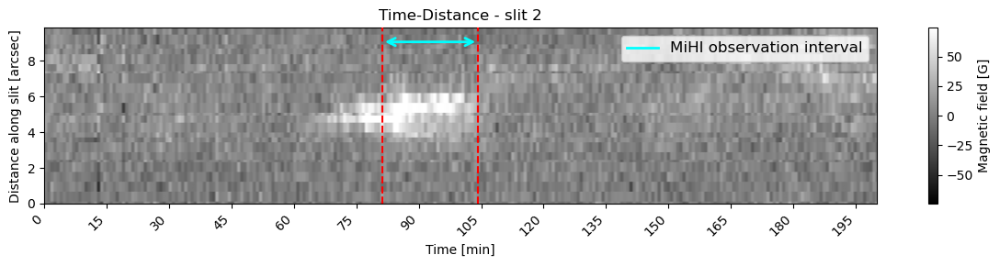

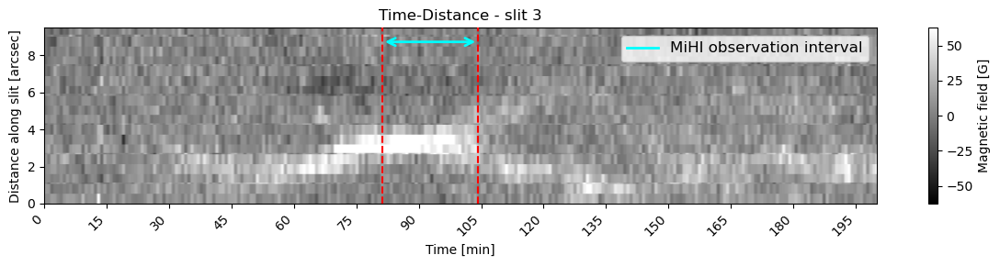

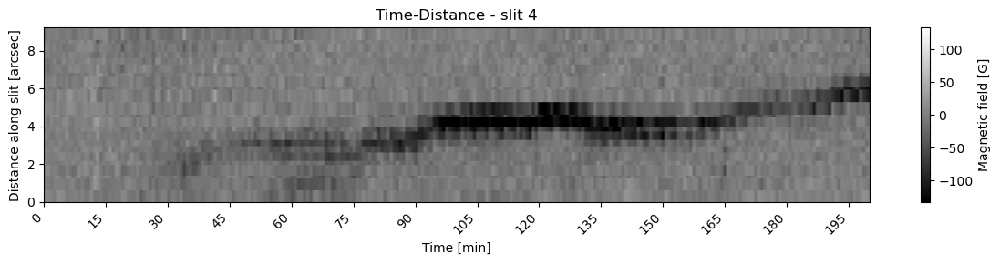

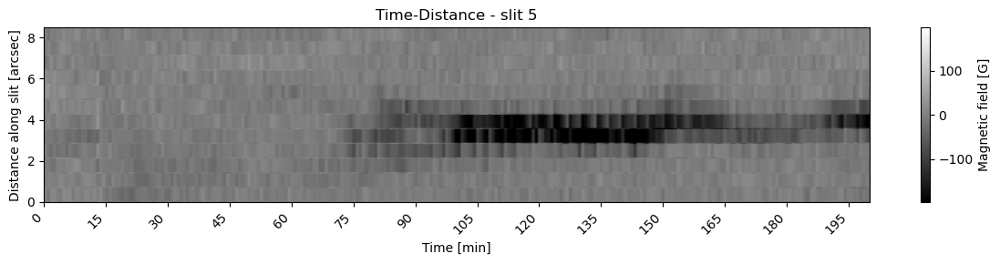

Figuras guardadas en: output_time_distance
slit 1: (28.3307, 38.8785) -> (22.6693, 46.1215)
slit 2: (21.0, 44.0) -> (30.0, 40.0)
slit 3: (27.0, 45.0) -> (24.0, 36.0)
slit 4: (15.0, 30.0) -> (8.0, 36.0)
slit 5: (8.0, 37.0) -> (2.0, 43.0)


In [8]:
# =========================================================================
# MULTI-SLIT: MAPA GENERAL + 5 TIME-DISTANCE + GUARDADO DE FIGURAS
# =========================================================================

import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import astropy.units as u
from astropy.coordinates import SkyCoord
from matplotlib.lines import Line2D

# -------------------------------------------------------------------------
# 0. Carpeta de salida para guardar figuras
# -------------------------------------------------------------------------
output_dir = "output_time_distance"
os.makedirs(output_dir, exist_ok=True)

# -------------------------------------------------------------------------
# 1. Construir el mapa SunPy del frame del cubo
# -------------------------------------------------------------------------
datos_frame_2d = cubo_datos[indice_frame, :, :]
mapa_frame_cubo = smap.Map(datos_frame_2d, submap.meta)

# ROI en píxeles del mapa del cubo, solo para visualizar la región
mihi_roi_pixel_cubo = mihi_roi_sky.to_pixel(mapa_frame_cubo.wcs)

# -------------------------------------------------------------------------
# 2. Definir TODOS los slits
# -------------------------------------------------------------------------
slits = [
    {
        "label": "slit 1",
        "x0": 28.3307, "y0": 38.8785,
        "x1": 22.6693, "y1": 46.1215,
        "color": "red"
    },
    {
        "label": "slit 2",
        "x0": 21.0, "y0": 44.0,
        "x1": 30.0, "y1": 40.0,
        "color": "lime"
    },
    {
        "label": "slit 3",
        "x0": 27.0, "y0": 45.0,
        "x1": 24.0, "y1": 36.0,
        "color": "orange"
    },
    {
        "label": "slit 4",
        "x0": 15.0, "y0": 30.0,
        "x1": 8.0,  "y1": 36.0,
        "color": "cyan"
    },
    {
        "label": "slit 5",
        "x0": 8.0,  "y0": 37.0,
        "x1": 2.0,  "y1": 43.0,
        "color": "yellow"
    }
]

# Número de puntos por slit
n_points = 250

# Cadencia temporal
dt_seconds = 45.0

# Dimensiones del cubo
N_frames, ny, nx = cubo_datos.shape
tiempo_horas = np.arange(N_frames) * dt_seconds / 60.0  # realmente en minutos

# Guardaremos resultados aquí
resultados_slits = []

# -------------------------------------------------------------------------
# 3. Procesar cada slit: coordenadas cielo -> píxeles -> time-distance
# -------------------------------------------------------------------------
for slit in slits:
    x0_arc, y0_arc = slit["x0"], slit["y0"]
    x1_arc, y1_arc = slit["x1"], slit["y1"]

    x_line_arc = np.linspace(x0_arc, x1_arc, n_points) * u.arcsec
    y_line_arc = np.linspace(y0_arc, y1_arc, n_points) * u.arcsec

    slit_sky_coords = SkyCoord(
        x_line_arc,
        y_line_arc,
        frame=mapa_frame_cubo.coordinate_frame
    )

    slit_x_pix, slit_y_pix = mapa_frame_cubo.world_to_pixel(slit_sky_coords)

    j_slit = np.round(slit_x_pix.to_value(u.pixel)).astype(int)
    i_slit = np.round(slit_y_pix.to_value(u.pixel)).astype(int)

    j_slit = np.clip(j_slit, 0, nx - 1)
    i_slit = np.clip(i_slit, 0, ny - 1)

    dist_along_slit_arcsec = np.sqrt(
        (x_line_arc.to_value(u.arcsec) - x_line_arc[0].to_value(u.arcsec))**2 +
        (y_line_arc.to_value(u.arcsec) - y_line_arc[0].to_value(u.arcsec))**2
    )

    time_distance = np.empty((N_frames, n_points), dtype=np.float32)

    for k in range(N_frames):
        frame = cubo_datos[k]
        time_distance[k, :] = frame[i_slit, j_slit]

    resultados_slits.append({
        "label": slit["label"],
        "color": slit["color"],
        "x0": x0_arc, "y0": y0_arc,
        "x1": x1_arc, "y1": y1_arc,
        "skycoords": slit_sky_coords,
        "dist_arcsec": dist_along_slit_arcsec,
        "time_distance": time_distance
    })

# -------------------------------------------------------------------------
# 4. Graficar mapa general con los 5 slits superpuestos
# -------------------------------------------------------------------------
fig_map = plt.figure(figsize=(9, 9))
ax_map = fig_map.add_subplot(111, projection=mapa_frame_cubo)

vmax_MAG_cubo = np.nanpercentile(np.abs(mapa_frame_cubo.data), 99)

mapa_frame_cubo.plot(
    axes=ax_map,
    cmap='gray',
    norm=Normalize(vmin=-vmax_MAG_cubo, vmax=vmax_MAG_cubo)
)

# ROI en magenta
mihi_roi_pixel_cubo.plot(
    ax=ax_map,
    facecolor='none',
    edgecolor='magenta',
    linewidth=2,
    label='MiHI FOV'
)

# Dibujar todos los slits
for res in resultados_slits:
    ax_map.plot_coord(
        res["skycoords"],
        color=res["color"],
        linewidth=2,
        label=res["label"]
    )

    extremos_slit = SkyCoord(
        [res["x0"], res["x1"]] * u.arcsec,
        [res["y0"], res["y1"]] * u.arcsec,
        frame=mapa_frame_cubo.coordinate_frame
    )

    ax_map.plot_coord(
        extremos_slit,
        'o',
        color=res["color"],
        markersize=5
    )

    ax_map.text_coord(
        SkyCoord(
            res["x0"] * u.arcsec,
            res["y0"] * u.arcsec,
            frame=mapa_frame_cubo.coordinate_frame
        ),
        res["label"],
        color=res["color"],
        fontsize=9
    )

# Ticks WCS
ax_map.coords[0].set_ticks(spacing=10 * u.arcsec)
ax_map.coords[1].set_ticks(spacing=10 * u.arcsec)
ax_map.coords[0].set_major_formatter('s.s')
ax_map.coords[1].set_major_formatter('s.s')

# Mismo zoom que tu ejemplo
ax_map.set_xlim(cx_pix.value - 80, cx_pix.value + 80)
ax_map.set_ylim(cy_pix.value - 80, cy_pix.value + 80)

ax_map.set_title(f"HMI Magnetogram {DATE_OBS} with MiHI FOV and Time–Distance Slits")
plt.legend(loc='upper left', fontsize=14)
plt.tight_layout()

map_filename = os.path.join(output_dir, "mapa_general_5_slits.png")
fig_map.savefig(map_filename, dpi=200, bbox_inches="tight")
plt.show()

# -------------------------------------------------------------------------
# 5. Graficar y guardar un time-distance por cada slit
# -------------------------------------------------------------------------
xline1 = 115 * 45 / 60.0 - 5
xline2 = 115 * 45 / 60.0 + 23.0 -5
slits_con_lineas = {"slit 1", "slit 2", "slit 3"}

for res in resultados_slits:
    fig_td, ax_td = plt.subplots(figsize=(12, 3))

    td = res["time_distance"]
    dist_arcsec = res["dist_arcsec"]

    vmax_td = np.nanpercentile(np.abs(td), 99.0)

    im_td = ax_td.imshow(
        td.T,
        origin='lower',
        aspect='auto',
        cmap='gray',
        norm=Normalize(vmin=-vmax_td, vmax=vmax_td),
        extent=(
            tiempo_horas[0],
            tiempo_horas[-1],
            dist_arcsec[0],
            dist_arcsec[-1]
        )
    )

    ax_td.set_ylabel("Distance along slit [arcsec]")
    ax_td.set_title(f"Time-Distance - {res['label']}")

    # Dibujar líneas verticales solo en slit 1 y slit 5
    if res["label"] in slits_con_lineas:

        # Líneas rojas
        ax_td.axvline(
            x=xline1,
            color='red',
            linestyle='--',
            linewidth=1.5,
            zorder=5
        )
    
        ax_td.axvline(
            x=xline2,
            color='red',
            linestyle='--',
            linewidth=1.5,
            zorder=5
        )
    
        # Flecha bidireccional cyan entre ambas líneas
        y_arrow = 0.92
    
        ax_td.annotate(
            '',
            xy=(xline1, y_arrow),
            xytext=(xline2, y_arrow),
            xycoords=('data', 'axes fraction'),
            textcoords=('data', 'axes fraction'),
            arrowprops=dict(
                arrowstyle='<->',
                color='cyan',
                linewidth=2,
                mutation_scale=15
            ),
            zorder=6
        )
    
        # Label normal para la leyenda
        arrow_label = Line2D(
            [0],
            [0],
            color='cyan',
            linewidth=2,
            linestyle='-',
            label='MiHI observation interval'
        )
    
        ax_td.legend(
            handles=[arrow_label],
            fontsize=12,
            loc='upper right'
        )
    tick_step_min = 15
    t_min = int(np.floor(tiempo_horas[0]))
    t_max = int(np.ceil(tiempo_horas[-1]))
    
    time_ticks = np.arange(t_min, t_max + tick_step_min, tick_step_min, dtype=int)
    
    ax_td.set_xticks(time_ticks)
    ax_td.set_xticklabels(time_ticks, rotation=45, ha='right')
    
    ax_td.set_xlim(0, 200)
    ax_td.set_xlabel("Time [min]")
    
    cbar = plt.colorbar(im_td, ax=ax_td)
    cbar.set_label("Magnetic field [G]")

    plt.tight_layout()

    td_filename = os.path.join(output_dir, f"TD_{res['label']}.png")
    fig_td.savefig(td_filename, dpi=200, bbox_inches="tight")
    #plt.grid()
    plt.show()

# -------------------------------------------------------------------------
# 6. (Opcional) imprimir resumen para identificar cada slit
# -------------------------------------------------------------------------
print("Figuras guardadas en:", output_dir)
for res in resultados_slits:
    print(
        f"{res['label']}: "
        f"({res['x0']}, {res['y0']}) -> ({res['x1']}, {res['y1']})"
    )

In [9]:
from astropy.coordinates import SkyCoord
import astropy.units as u

# Extremos del slit en arcsec
x0_arc, y0_arc = 27.3307, 35.8785   # Esquina inferior derecha
x1_arc, y1_arc = 22.6693, 46.1215   # Esquina superior izquierda

# Frame de referencia del mapa
frame = mapa_frame_cubo.coordinate_frame

p0 = SkyCoord(x0_arc * u.arcsec, y0_arc * u.arcsec, frame=frame)
p1 = SkyCoord(x1_arc * u.arcsec, y1_arc * u.arcsec, frame=frame)

# Separación angular total del slit
slit_length = p0.separation(p1)              # Quantity angular
slit_length_arcsec = slit_length.to(u.arcsec).value

print("Longitud del slit:", slit_length_arcsec, "arcsec")

Longitud del slit: 11.25378594505045 arcsec


Forma de time_distance (nuevo slit): (355, 250)


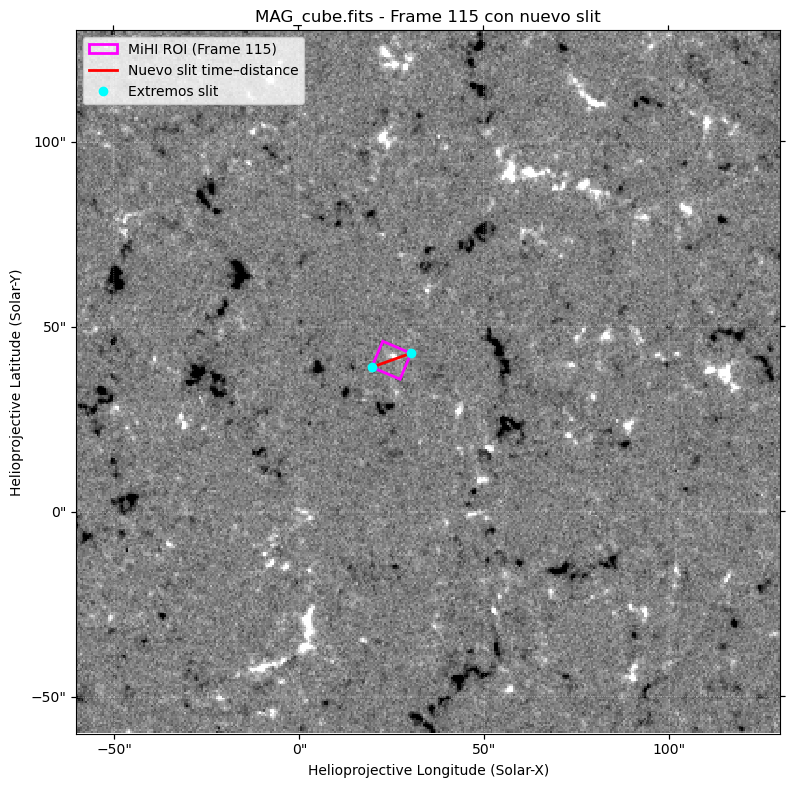

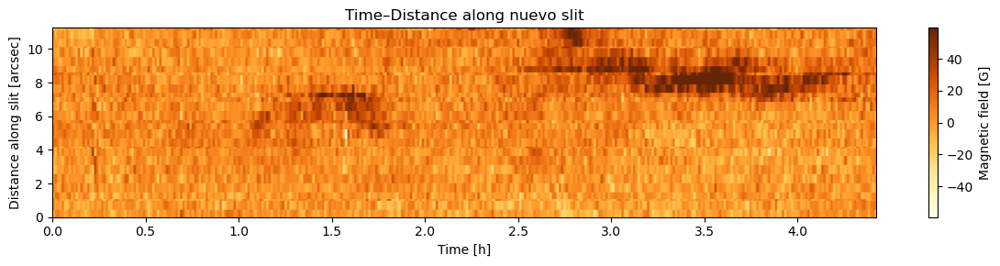

In [10]:
# =========================================================================
# NUEVO SLIT EN ARCSEC + OVERPLOT EN EL MAPA + TIME-DISTANCE
# =========================================================================

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import astropy.units as u
from astropy.coordinates import SkyCoord

# -------------------------------------------------------------------------
# 0. Supuestos:
#    - cubo_datos tiene forma (N_frames, ny, nx)
#    - indice_frame ya está definido
#    - submap.meta viene del mapa de referencia con la geometría correcta
#    - mihi_roi_sky ya existe y está en coordenadas de cielo
# -------------------------------------------------------------------------

# -------------------------------------------------------------------------
# 1. Construir el mapa SunPy del frame del cubo
# -------------------------------------------------------------------------
datos_frame_2d = cubo_datos[indice_frame, :, :]
mapa_frame_cubo = smap.Map(datos_frame_2d, submap.meta)

# ROI en píxeles del mapa del cubo, solo para visualizar la región
mihi_roi_pixel_cubo = mihi_roi_sky.to_pixel(mapa_frame_cubo.wcs)

# -------------------------------------------------------------------------
# 2. Definir los extremos del nuevo slit en ARCSEC
# -------------------------------------------------------------------------
x0_arc, y0_arc = 19.69,   39.125    # Extremo 1
x1_arc, y1_arc = 30.3066, 42.867    # Extremo 2

# Número de puntos a lo largo del slit
n_points = 250

x_line_arc = np.linspace(x0_arc, x1_arc, n_points) * u.arcsec
y_line_arc = np.linspace(y0_arc, y1_arc, n_points) * u.arcsec

# SkyCoord del slit en el frame del mapa
slit_sky_coords = SkyCoord(
    x_line_arc,
    y_line_arc,
    frame=mapa_frame_cubo.coordinate_frame
)

# -------------------------------------------------------------------------
# 3. Convertir el slit a píxeles para samplear el cubo
# -------------------------------------------------------------------------
slit_x_pix, slit_y_pix = mapa_frame_cubo.world_to_pixel(slit_sky_coords)

j_slit = np.round(slit_x_pix.to_value(u.pixel)).astype(int)  # eje X
i_slit = np.round(slit_y_pix.to_value(u.pixel)).astype(int)  # eje Y

# Limitar a los bordes del cubo
N_frames, ny, nx = cubo_datos.shape
j_slit = np.clip(j_slit, 0, nx - 1)
i_slit = np.clip(i_slit, 0, ny - 1)

# -------------------------------------------------------------------------
# 4. Distancia espacial a lo largo del slit en ARCSEC
# -------------------------------------------------------------------------
dist_along_slit_arcsec = np.sqrt(
    (x_line_arc.to_value(u.arcsec) - x_line_arc[0].to_value(u.arcsec))**2 +
    (y_line_arc.to_value(u.arcsec) - y_line_arc[0].to_value(u.arcsec))**2
)

# -------------------------------------------------------------------------
# 5. Extraer el time-distance a lo largo del slit
# -------------------------------------------------------------------------
time_distance = np.empty((N_frames, n_points), dtype=np.float32)

for k in range(N_frames):
    frame = cubo_datos[k]
    time_distance[k, :] = frame[i_slit, j_slit]

print("Forma de time_distance (nuevo slit):", time_distance.shape)

# -------------------------------------------------------------------------
# 6. Graficar el frame con la ROI y el nuevo slit
# -------------------------------------------------------------------------
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection=mapa_frame_cubo)

vmax_MAG_cubo = np.nanpercentile(np.abs(mapa_frame_cubo.data), 99)

mapa_frame_cubo.plot(
    axes=ax,
    cmap='gray',
    norm=Normalize(vmin=-vmax_MAG_cubo, vmax=vmax_MAG_cubo)
)

# Región MiHI en magenta
mihi_roi_pixel_cubo.plot(
    ax=ax,
    facecolor='none',
    edgecolor='magenta',
    linewidth=2,
    label=f'MiHI ROI (Frame {indice_frame})'
)

# Slit en rojo, directamente en coordenadas del cielo
ax.plot_coord(
    slit_sky_coords,
    color='red',
    linewidth=2,
    label='Nuevo slit time–distance'
)

# Extremos del slit en cian
extremos_slit = SkyCoord(
    [x0_arc, x1_arc] * u.arcsec,
    [y0_arc, y1_arc] * u.arcsec,
    frame=mapa_frame_cubo.coordinate_frame
)
ax.plot_coord(
    extremos_slit,
    'o',
    color='cyan',
    markersize=6,
    label='Extremos slit'
)

# Mismo zoom que tu ejemplo
ax_map.set_xlim(cx_pix.value - 80, cx_pix.value + 80)
ax_map.set_ylim(cy_pix.value - 80, cy_pix.value + 80)
ax.set_title(f"MAG_cube.fits - Frame {indice_frame} con nuevo slit")
plt.legend(loc='upper left')
plt.tight_layout()
plt.show()

# -------------------------------------------------------------------------
# 7. Graficar el mapa time–distance con eje espacial en ARCSEC
# -------------------------------------------------------------------------
# Cadencia temporal (ajusta según tu cubo; aquí asumo 45 s como HMI 45s)
dt_seconds = 45.0
tiempo_horas = np.arange(N_frames) * dt_seconds / 3600.0

fig, ax = plt.subplots(figsize=(12, 3))

vmax_td = np.nanpercentile(np.abs(time_distance), 99.0)

im_td = ax.imshow(
    time_distance.T,
    origin='lower',
    aspect='auto',
    cmap='YlOrBr',
    norm=Normalize(vmin=-vmax_td, vmax=vmax_td),
    extent=(
        tiempo_horas[0],
        tiempo_horas[-1],
        dist_along_slit_arcsec[0],
        dist_along_slit_arcsec[-1]
    )
)

ax.set_xlabel("Time [h]")
ax.set_ylabel("Distance along slit [arcsec]")
ax.set_title("Time–Distance along nuevo slit")



cbar = plt.colorbar(im_td, ax=ax)
cbar.set_label("Magnetic field [G]")

plt.tight_layout()
plt.show()

In [11]:
from astropy.coordinates import SkyCoord
import astropy.units as u
import numpy as np

# 1. Centro y tamaño de la ROI en cielo (MiHI)
cx_sky = mihi_roi_sky.center.Tx.to_value(u.arcsec)
cy_sky = mihi_roi_sky.center.Ty.to_value(u.arcsec)

width_sky  = mihi_roi_sky.width.to_value(u.arcsec)   # tamaño en X
height_sky = mihi_roi_sky.height.to_value(u.arcsec)  # tamaño en Y

# Mitades
dx = width_sky / 2.0
dy = height_sky / 2.0

# 2. Four corners (X,Y) en arcsec
x_corners_arc = np.array([cx_sky - dx,
                          cx_sky + dx,
                          cx_sky + dx,
                          cx_sky - dx])

y_corners_arc = np.array([cy_sky - dy,  # esquina inferior
                          cy_sky - dy,
                          cy_sky + dy,  # esquina superior
                          cy_sky + dy])

# 3. Construir SkyCoord para esas esquinas
corners_sky = SkyCoord(x_corners_arc * u.arcsec,
                       y_corners_arc * u.arcsec,
                       frame=mihi_roi_sky.center.frame)

# 4. Convertir esas esquinas al frame del mapa del cubo (por si hay ligera diferencia)
corners_sky_in_cubo = corners_sky.transform_to(mapa_frame_cubo.coordinate_frame)

x_vertices_arc = corners_sky_in_cubo.Tx.to_value(u.arcsec)
y_vertices_arc = corners_sky_in_cubo.Ty.to_value(u.arcsec)

# 5. Buscar menor y mayor Y
idx_menor_y = np.argmin(y_vertices_arc)
idx_mayor_y = np.argmax(y_vertices_arc)

x0_arc, y0_arc = x_vertices_arc[idx_menor_y], y_vertices_arc[idx_menor_y]
x1_arc, y1_arc = x_vertices_arc[idx_mayor_y], y_vertices_arc[idx_mayor_y]

In [12]:
# Usa el tamaño en píxeles de la ROI para fijar la longitud de la slit
n_points = int(min(mihi_roi_pixel_cubo.height, mihi_roi_pixel_cubo.width))

x_line_arc = np.linspace(x0_arc, x1_arc, n_points) * u.arcsec
y_line_arc = np.linspace(y0_arc, y1_arc, n_points) * u.arcsec

slit_sky_coords = SkyCoord(x_line_arc, y_line_arc,
                           frame=mapa_frame_cubo.coordinate_frame)

# Píxeles de la slit en el mapa/cubo
slit_x_pix, slit_y_pix = mapa_frame_cubo.world_to_pixel(slit_sky_coords)

j_diag = np.round(slit_x_pix.to_value(u.pixel)).astype(int)
i_diag = np.round(slit_y_pix.to_value(u.pixel)).astype(int)

# Limitar a los bordes del cubo
N_frames, ny_c, nx_c = cubo_datos.shape
j_diag = np.clip(j_diag, 0, nx_c - 1)
i_diag = np.clip(i_diag, 0, ny_c - 1)

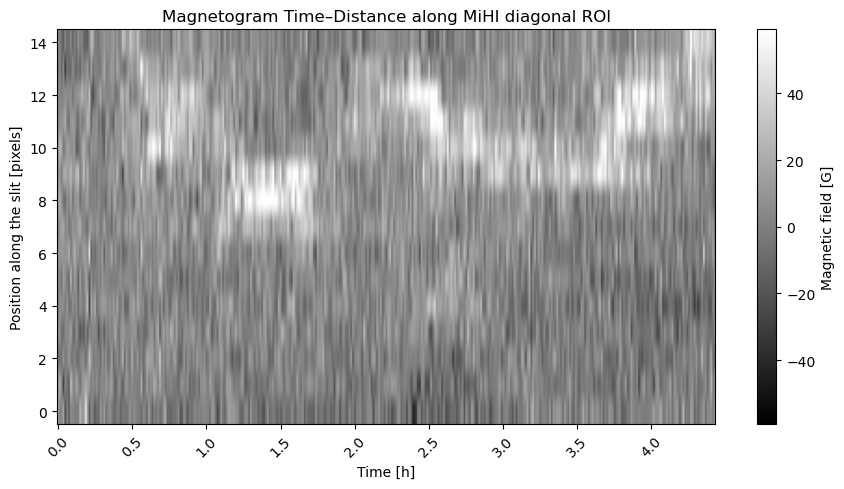

In [13]:
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize

# Matriz tiempo–distancia
time_distance = np.empty((N_frames, n_points), dtype=np.float32)

for k in range(N_frames):
    frame = cubo_datos[k]
    time_distance[k, :] = frame[i_diag, j_diag]

# Escala temporal (HMI M45s)
dt_seconds = 45.0
total_time_hours = (N_frames - 1) * dt_seconds / 3600.0

tick_step_hours = 0.5
time_ticks_hours = np.arange(0.0, total_time_hours + tick_step_hours, tick_step_hours)
frame_ticks = (time_ticks_hours * 3600.0 / dt_seconds).astype(int)
frame_ticks = frame_ticks[frame_ticks < N_frames]

fig, ax = plt.subplots(figsize=(9, 5))

vmax_mag = np.nanpercentile(np.abs(time_distance), 99.0)

im_td = ax.imshow(
    time_distance.T,
    origin="lower",
    aspect="auto",
    cmap="gray",
    norm=Normalize(vmin=-vmax_mag, vmax=vmax_mag)
)

ax.set_xticks(frame_ticks)
ax.set_xticklabels(np.round(time_ticks_hours[:len(frame_ticks)], 2))

ax.set_xlabel("Time [h]")
ax.set_ylabel("Position along the slit [pixels]")
ax.set_title("Magnetogram Time–Distance along MiHI diagonal ROI")
ax.tick_params(axis="x", labelrotation=45)

cbar = plt.colorbar(im_td, ax=ax, label="Magnetic field [G]")
plt.tight_layout()
plt.show()

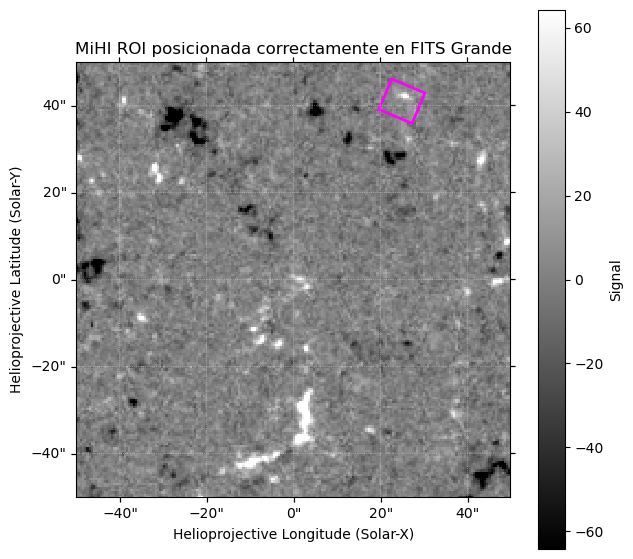

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import sunpy.map as smap
from astropy.coordinates import SkyCoord
import astropy.units as u
from regions import RectangleSkyRegion

# 1. Cargar el archivo FITS GRANDE del proyecto
fname_target = "LOS.B.0000.fits"
frame_map = smap.Map(fname_target)

# 2. DEFINICIÓN REAL EN EL MARCO GRANDE
# Forzamos a que el centro de la ROI se calcule usando el WCS real del Sol completo
centro_x = 25.0 * u.arcsec
centro_y = 41.0 * u.arcsec
ancho_arcsec = 8.3 * u.arcsec
alto_arcsec = 7.6 * u.arcsec

# ¡AQUÍ ESTÁ EL CAMBIO CLAVE! Usamos 'frame_map.coordinate_frame' del mapa grande
centro_mihi_real = SkyCoord(centro_x, centro_y, frame=frame_map.coordinate_frame)

mihi_roi_sky_real = RectangleSkyRegion(
    center=centro_mihi_real,
    width=ancho_arcsec,
    height=alto_arcsec,
    angle=theta_deg
)

# 3. Convertir a los píxeles de la matriz 4096 x 4096
mihi_roi_pixel_target = mihi_roi_sky_real.to_pixel(frame_map.wcs)

# 4. Graficado base
fig = plt.figure(figsize=(7, 7))
ax = fig.add_subplot(projection=frame_map)

frame_map.plot(
    axes=ax,
    cmap="gray",
    norm=Normalize(vmin=-vmax_MAG, vmax=vmax_MAG)
    #norm=Normalize(vmin=-500, vmax=500) 
)

# 5. Dibujar la región en su lugar real
mihi_roi_pixel_target.plot(ax=ax, facecolor='none', edgecolor='magenta', linewidth=2)

# 6. Hacer el Zoom a la zona real en arcosegundos para inspección
limite_min = SkyCoord(-50.0 * u.arcsec, -50.0 * u.arcsec, frame=frame_map.coordinate_frame)
limite_max = SkyCoord(50.0 * u.arcsec, 50.0 * u.arcsec, frame=frame_map.coordinate_frame)

x_min_pix, y_min_pix = frame_map.world_to_pixel(limite_min)
x_max_pix, y_max_pix = frame_map.world_to_pixel(limite_max)

ax.set_xlim(x_min_pix.value, x_max_pix.value)
ax.set_ylim(y_min_pix.value, y_max_pix.value)

plt.colorbar(ax.images[0], ax=ax, label="Signal")
ax.set_title("MiHI ROI posicionada correctamente en FITS Grande")
plt.show()

In [15]:
from astropy.io import fits

# 1. Cargar la plantilla perfecta
header_perfecto = fits.getheader('LOS_EGRESS_PWR_5.0_7.0mHz.fits')

# 2. Lista de las COPIAS que creaste con 'cp' y que vas a modificar
archivos_copiados = [
    'LOS_EGRESS_PWR_7.0_9.0mHz_fixed.fits',
    'LOS_EGRESS_PWR_9.0_11.0mHz_fixed.fits'
]

for fits_malo in archivos_copiados:
    # Extraer la matriz de datos de intensidad real
    data_potencia = fits.getdata(fits_malo)
    
    # Unir los datos reales con el header clonado sano
    fits_reparado = fits.PrimaryHDU(data=data_potencia, header=header_perfecto)
    
    # Sobrescribir la copia con el nuevo contenido corregido
    fits_reparado.writeto(fits_malo, overwrite=True)
    
    print(f"¡Copia modificada con éxito para siempre!: {fits_malo}")

¡Copia modificada con éxito para siempre!: LOS_EGRESS_PWR_7.0_9.0mHz_fixed.fits
¡Copia modificada con éxito para siempre!: LOS_EGRESS_PWR_9.0_11.0mHz_fixed.fits


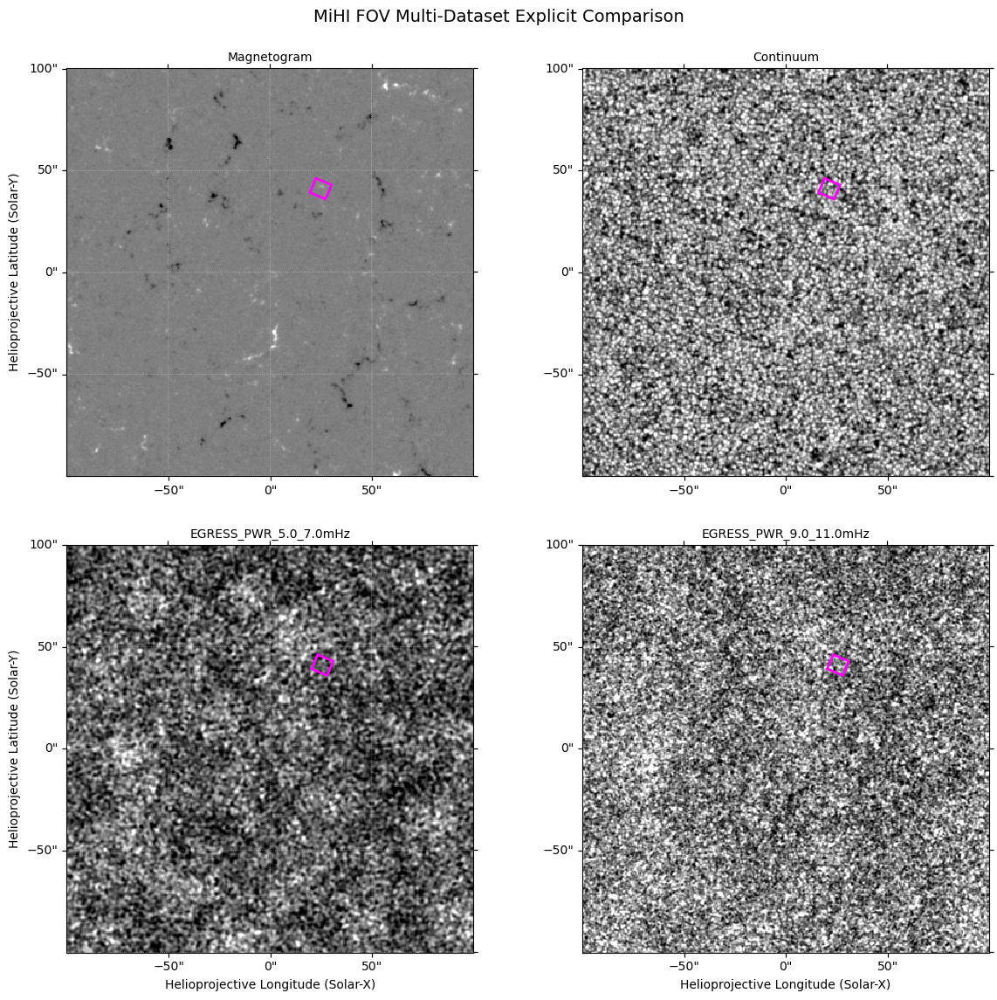

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import sunpy.map as smap
from astropy.coordinates import SkyCoord
import astropy.units as u

# =========================================================================
# 1. CARGAR TODOS LOS MAPAS DE FORMA INDEPENDIENTE
# =========================================================================
map_B      = smap.Map('LOS.B.0000.fits')
map_CONT   = smap.Map('LOS.CONTIN.0000.fits')
map_PWR5   = smap.Map('LOS_EGRESS_PWR_5.0_7.0mHz.fits')
map_PWR9   = smap.Map('LOS_EGRESS_PWR_9.0_11.0mHz_fixed.fits')

# Inicializar la figura global del mosaico
fig = plt.figure(figsize=(12, 12))

# =========================================================================
# SUBPLOT 1: MAGNETOGRAMA (Fila 1, Columna 1)
# =========================================================================
ax1 = fig.add_subplot(2, 2, 1, projection=map_B)
vmax_MAG = 250  # Control manual de Gauss
map_B.plot(axes=ax1, cmap="gray", norm=Normalize(vmin=-vmax_MAG, vmax=vmax_MAG))

roi_pix_1 = mihi_roi_sky_real.to_pixel(map_B.wcs)
roi_pix_1.plot(ax=ax1, facecolor='none', edgecolor='magenta', linewidth=2)
ax1.set_title('Magnetogram', fontsize=10)
ax1.coords[0].set_axislabel(' ')  # Ocultar etiqueta X (fila superior)

# =========================================================================
# SUBPLOT 2: CONTINUO (Fila 1, Columna 2)
# =========================================================================
ax2 = fig.add_subplot(2, 2, 2, projection=map_CONT)
map_CONT.plot(
    axes=ax2, 
    cmap="gray", 
    vmin=np.nanpercentile(map_CONT.data, 1), 
    vmax=np.nanpercentile(map_CONT.data, 99)
)

roi_pix_2 = mihi_roi_sky_real.to_pixel(map_CONT.wcs)
roi_pix_2.plot(ax=ax2, facecolor='none', edgecolor='magenta', linewidth=2)

ax2.set_title('Continuum', fontsize=10)
ax2.coords[0].set_axislabel(' ')  # Ocultar etiqueta X
ax2.coords[1].set_axislabel(' ')  # Ocultar etiqueta Y (columna derecha)

# =========================================================================
# SUBPLOT 3: POTENCIA 5.0 - 7.0 mHz (Fila 2, Columna 1)
# =========================================================================
ax3 = fig.add_subplot(2, 2, 3, projection=map_PWR5)
map_PWR5.plot(
    axes=ax3, 
    cmap="gray", 
    vmin=np.nanpercentile(map_PWR5.data, 1), 
    vmax=np.nanpercentile(map_PWR5.data, 99.5)
)

roi_pix_3 = mihi_roi_sky_real.to_pixel(map_PWR5.wcs)
roi_pix_3.plot(ax=ax3, facecolor='none', edgecolor='magenta', linewidth=2, label='MiHI FOV')
ax3.set_title('EGRESS_PWR_5.0_7.0mHz', fontsize=10)

# =========================================================================
# SUBPLOT 4: POTENCIA 9.0 - 11.0 mHz (Fila 2, Columna 2)
# =========================================================================
ax4 = fig.add_subplot(2, 2, 4, projection=map_PWR9)
map_PWR9.plot(
    axes=ax4, 
    cmap="gray", # Puedes cambiar este por "magma" o "plasma" si quieres diferenciarlos
    vmin=0.012,
    vmax=0.019
    #vmin=np.nanpercentile(map_PWR9.data, 7), 
    #vmax=np.nanpercentile(map_PWR9.data, 99.9)
)

roi_pix_4 = mihi_roi_sky_real.to_pixel(map_PWR9.wcs)
roi_pix_4.plot(ax=ax4, facecolor='none', edgecolor='magenta', linewidth=2)
ax4.set_title('EGRESS_PWR_9.0_11.0mHz', fontsize=10)
ax4.coords[1].set_axislabel(' ')  # Ocultar etiqueta Y (columna derecha)

# =========================================================================
# 4. APLICAR ZOOM REPRODUCIBLE A TODOS LOS EJES
# =========================================================================
for ax_actual, mapa_actual in zip([ax1, ax2, ax3, ax4], [map_B, map_CONT, map_PWR5, map_PWR9]):
    limite_min = SkyCoord(-100.0 * u.arcsec, -100.0 * u.arcsec, frame=mapa_actual.coordinate_frame)
    limite_max = SkyCoord(100.0 * u.arcsec, 100.0 * u.arcsec, frame=mapa_actual.coordinate_frame)
    
    x_min_pix, y_min_pix = mapa_actual.world_to_pixel(limite_min)
    x_max_pix, y_max_pix = mapa_actual.world_to_pixel(limite_max)
    
    ax_actual.set_xlim(x_min_pix.value, x_max_pix.value)
    ax_actual.set_ylim(y_min_pix.value, y_max_pix.value)

# Configuración final y despliegue
fig.suptitle("MiHI FOV Multi-Dataset Explicit Comparison", fontsize=14, y=0.95)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig('Region_Context78.png')
plt.show()

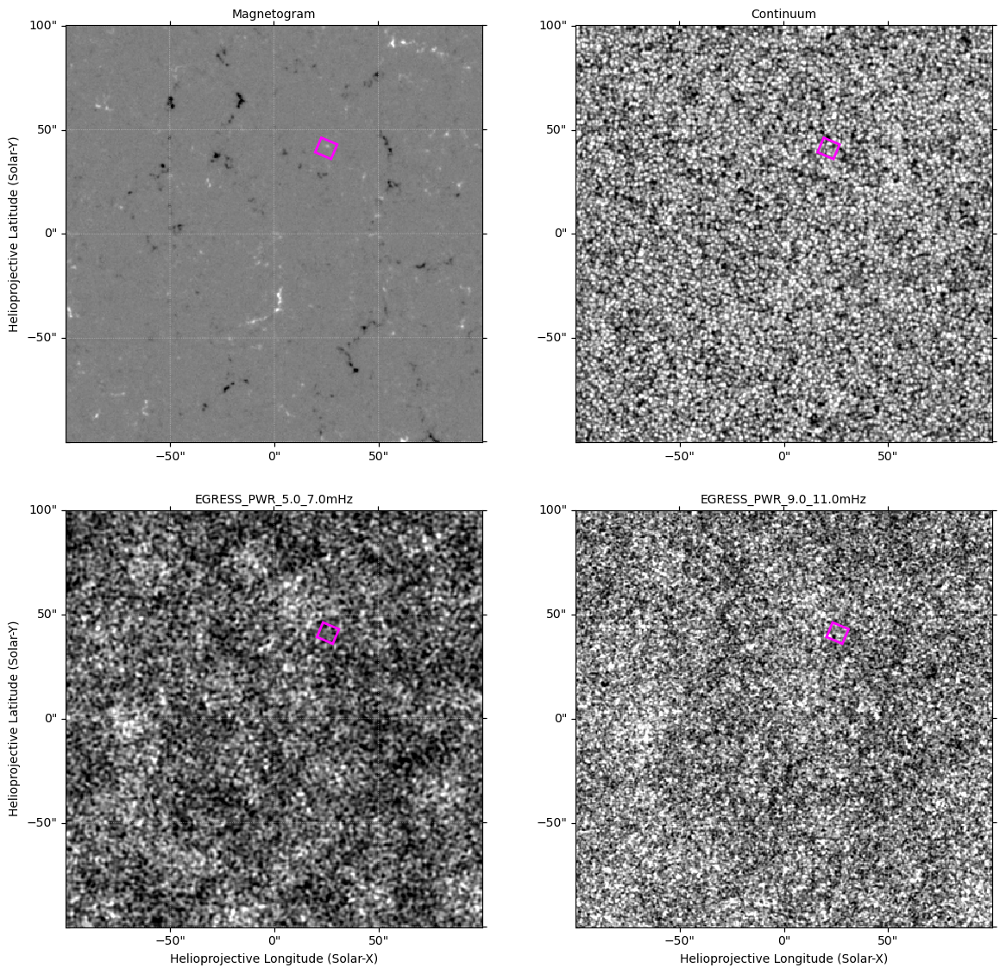

In [123]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import sunpy.map as smap
from astropy.coordinates import SkyCoord
import astropy.units as u

# =========================================================================
# 1. CARGAR TODOS LOS MAPAS DE FORMA INDEPENDIENTE
# =========================================================================
map_B      = smap.Map('LOS.B.0000.fits')
map_CONT   = smap.Map('LOS.CONTIN.0000.fits')
map_PWR5   = smap.Map('LOS_EGRESS_PWR_5.0_7.0mHz.fits')
map_PWR9   = smap.Map('LOS_EGRESS_PWR_9.0_11.0mHz_fixed.fits')

# Inicializar la figura global del mosaico
fig = plt.figure(figsize=(12, 12))

# =========================================================================
# SUBPLOT 1: MAGNETOGRAMA (Fila 1, Columna 1)
# =========================================================================
ax1 = fig.add_subplot(2, 2, 1, projection=map_B)
vmax_MAG = 250  # Control manual de Gauss
map_B.plot(axes=ax1, cmap="gray", norm=Normalize(vmin=-vmax_MAG, vmax=vmax_MAG))

roi_pix_1 = mihi_roi_sky_real.to_pixel(map_B.wcs)
roi_pix_1.plot(ax=ax1, facecolor='none', edgecolor='magenta', linewidth=2)
ax1.set_title('Magnetogram', fontsize=10)
ax1.coords[0].set_axislabel(' ')  # Ocultar etiqueta X (fila superior)

# =========================================================================
# SUBPLOT 2: CONTINUO (Fila 1, Columna 2)
# =========================================================================
ax2 = fig.add_subplot(2, 2, 2, projection=map_CONT)
map_CONT.plot(
    axes=ax2, 
    cmap="gray", 
    vmin=np.nanpercentile(map_CONT.data, 1), 
    vmax=np.nanpercentile(map_CONT.data, 99)
)

roi_pix_2 = mihi_roi_sky_real.to_pixel(map_CONT.wcs)
roi_pix_2.plot(ax=ax2, facecolor='none', edgecolor='magenta', linewidth=2)

ax2.set_title('Continuum', fontsize=10)
ax2.coords[0].set_axislabel(' ')  # Ocultar etiqueta X
ax2.coords[1].set_axislabel(' ')  # Ocultar etiqueta Y (columna derecha)

# =========================================================================
# SUBPLOT 3: POTENCIA 5.0 - 7.0 mHz (Fila 2, Columna 1)
# =========================================================================
ax3 = fig.add_subplot(2, 2, 3, projection=map_PWR5)
map_PWR5.plot(
    axes=ax3, 
    cmap="gray", 
    vmin=np.nanpercentile(map_PWR5.data, 1), 
    vmax=np.nanpercentile(map_PWR5.data, 99.5)
)

roi_pix_3 = mihi_roi_sky_real.to_pixel(map_PWR5.wcs)
roi_pix_3.plot(ax=ax3, facecolor='none', edgecolor='magenta', linewidth=2)
ax3.set_title('EGRESS_PWR_5.0_7.0mHz', fontsize=10)

# =========================================================================
# SUBPLOT 4: POTENCIA 9.0 - 11.0 mHz (Fila 2, Columna 2)
# =========================================================================
ax4 = fig.add_subplot(2, 2, 4, projection=map_PWR9)
map_PWR9.plot(
    axes=ax4, 
    cmap="gray", # Puedes cambiar este por "magma" o "plasma" si quieres diferenciarlos
    vmin=0.012,
    vmax=0.019
    #vmin=np.nanpercentile(map_PWR9.data, 7), 
    #vmax=np.nanpercentile(map_PWR9.data, 99.9)
)

roi_pix_4 = mihi_roi_sky_real.to_pixel(map_PWR9.wcs)
roi_pix_4.plot(ax=ax4, facecolor='none', edgecolor='magenta', linewidth=2)
ax4.set_title('EGRESS_PWR_9.0_11.0mHz', fontsize=10)
ax4.coords[1].set_axislabel(' ')  # Ocultar etiqueta Y (columna derecha)

# =========================================================================
# 4. APLICAR ZOOM REPRODUCIBLE A TODOS LOS EJES
# =========================================================================
for ax_actual, mapa_actual in zip([ax1, ax2, ax3, ax4], [map_B, map_CONT, map_PWR5, map_PWR9]):
    limite_min = SkyCoord(-100.0 * u.arcsec, -100.0 * u.arcsec, frame=mapa_actual.coordinate_frame)
    limite_max = SkyCoord(100.0 * u.arcsec, 100.0 * u.arcsec, frame=mapa_actual.coordinate_frame)
    
    x_min_pix, y_min_pix = mapa_actual.world_to_pixel(limite_min)
    x_max_pix, y_max_pix = mapa_actual.world_to_pixel(limite_max)
    
    ax_actual.set_xlim(x_min_pix.value, x_max_pix.value)
    ax_actual.set_ylim(y_min_pix.value, y_max_pix.value)

# Configuración final y despliegue
#fig.suptitle("MiHI ROI Multi-Dataset Explicit Comparison", fontsize=14, y=0.95)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

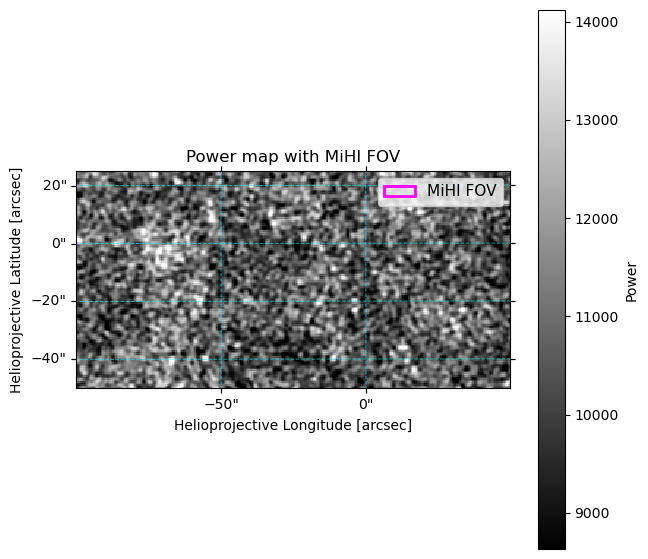

In [87]:
from astropy.coordinates import SkyCoord
import astropy.units as u
import matplotlib.pyplot as plt
import numpy as np

fig = plt.figure(figsize=(7, 7))
ax3 = fig.add_subplot(projection=map_PWR5)

map_PWR5.plot(
    axes=ax3,
    cmap="gray",
    vmin=np.nanpercentile(map_PWR5.data, 1),
    vmax=np.nanpercentile(map_PWR5.data, 99.5)
)

# ROI MiHI
roi_pix_3 = mihi_roi_sky_real.to_pixel(map_PWR5.wcs)

roi_pix_3.plot(
    ax=ax3,
    facecolor='none',
    edgecolor='magenta',
    linewidth=2,
    label='MiHI FOV'
)

# Límites en coordenadas helioproyectivas
limite_min = SkyCoord(
    -100.0 * u.arcsec,
    -50.0 * u.arcsec,
    frame=map_PWR5.coordinate_frame
)

limite_max = SkyCoord(
    50.0 * u.arcsec,
    25.0 * u.arcsec,
    frame=map_PWR5.coordinate_frame
)

# Convertir límites WCS a píxeles
x_min, y_min = map_PWR5.world_to_pixel(limite_min)
x_max, y_max = map_PWR5.world_to_pixel(limite_max)

# Aplicar límites al plot
ax3.set_xlim(x_min.value, x_max.value)
ax3.set_ylim(y_min.value, y_max.value)

# Grid helioproyectivo
ax3.coords.grid(
    True,
    color='cyan',
    linestyle='--',
    linewidth=0.7,
    alpha=0.6
)

ax3.coords[0].set_axislabel("Helioprojective Longitude [arcsec]")
ax3.coords[1].set_axislabel("Helioprojective Latitude [arcsec]")

plt.colorbar(ax3.images[0], ax=ax3, label="Power")
ax3.set_title("Power map with MiHI FOV")
ax3.legend(loc="upper right", fontsize=11)

plt.show()

In [112]:
import sunpy.map as smap
import astropy.units as u
from astropy.coordinates import SkyCoord

egr = smap.Map("LOS_EGRESS_PWR_5.0_7.0mHz.fits")
mag = smap.Map("LOS.B.0000.fits")
data_EGRESS = egr.data
vmin, vmax = np.nanpercentile(data_EGRESS, [1, 99])
pixel_scale_Mm = 0.348          # <- tu valor comentado ES el correcto (0.0005 rad × 696 Mm)

seeds_arcsec = [(15, 55), (-73, -5), (26, -25), (82, -35), (-10,75)]
centers = []
for sx, sy in seeds_arcsec:
    w = SkyCoord(sx*u.arcsec, sy*u.arcsec, frame=egr.coordinate_frame)
    xp, yp = egr.world_to_pixel(w)
    centers.append((int(round(xp.to_value(u.pix))), int(round(yp.to_value(u.pix)))))
print("arcsec -> pixel:", centers)

arcsec -> pixel: [(2009, 1942), (2183, 2061), (1987, 2100), (1876, 2120), (2058, 1902)]


In [113]:
import numpy as np

half_height = 40   # semiancho del recorte [px]

def get_crop(data, cx, cy, hh):
    ny, nx = data.shape
    if cx-hh < 0 or cx+hh > nx or cy-hh < 0 or cy+hh > ny:
        return None, False
    return data[cy-hh:cy+hh, cx-hh:cx+hh], True

def fit_circle(x, y):
    x_m, y_m = np.mean(x), np.mean(y)
    u, v = x - x_m, y - y_m
    Suu, Svv, Suv = np.sum(u**2), np.sum(v**2), np.sum(u*v)
    B = np.array([np.sum(u**3)+np.sum(u*v**2), np.sum(v**3)+np.sum(v*u**2)]) / 2
    uc, vc = np.linalg.solve(np.array([[Suu, Suv], [Suv, Svv]]), B)
    xc, yc = x_m + uc, y_m + vc
    r = np.mean(np.sqrt((x-xc)**2 + (y-yc)**2))
    return xc, yc, r

def mask_border(mask):
    """Contorno de la máscara: píxeles True con algún vecino (4-conn) False."""
    m = mask
    inner = np.zeros_like(m)
    inner[1:-1, 1:-1] = (m[1:-1,1:-1] &
        (~m[:-2,1:-1] | ~m[2:,1:-1] | ~m[1:-1,:-2] | ~m[1:-1,2:]))
    edge = np.zeros_like(m); edge[0,:]=edge[-1,:]=edge[:,0]=edge[:,-1]=True
    border = inner | (m & edge)
    ys, xs = np.where(border)
    return xs.astype(float), ys.astype(float)

# --- Paso 1: recortes ---
crops, valids = [], []
for (cx, cy) in centers:
    crop, ok = get_crop(data_EGRESS, cx, cy, half_height)
    crops.append(crop); valids.append(ok)

# --- Paso 2: máscara por brillo (tu mismo umbral μ + σ/7) ---
masks = []
for i, crop in enumerate(crops):
    if not valids[i]:
        masks.append(None); continue
    thresh = np.mean(crop) + 2.5*np.std(crop)
    masks.append(crop > thresh)

# --- Paso 3: fit circular -> AQUÍ nace 'results' ---
results = []
for i, (crop, mask) in enumerate(zip(crops, masks)):
    if not valids[i] or mask is None or mask.sum() < 5:
        results.append(None); continue
    x_c, y_c = mask_border(mask)
    if len(x_c) < 5:
        results.append(None); continue
    xc, yc, r = fit_circle(x_c, y_c)
    results.append({"xc": xc, "yc": yc, "r_px": r,
                    "r_Mm": r*pixel_scale_Mm, "mask": mask})

print("results:", sum(r is not None for r in results), "de", len(results), "ajustados")

results: 5 de 5 ajustados


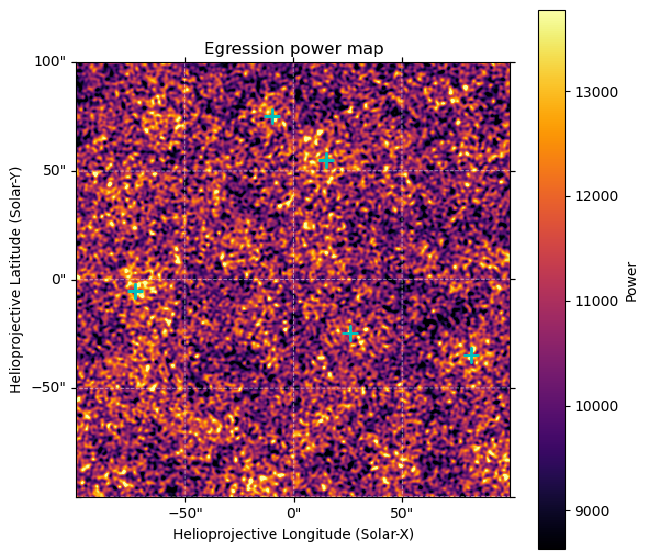

In [114]:
fig = plt.figure(figsize=(7, 7))
ax = fig.add_subplot(projection=egr)

egr.plot(
    axes=ax,
    cmap="inferno",
    vmin=vmin,
    vmax=vmax
)

for (cx, cy) in centers:
    ax.plot(
        cx,
        cy,
        "c+",
        markersize=12,
        markeredgewidth=2
    )

limite_min = SkyCoord(-100.0 * u.arcsec, -100.0 * u.arcsec, frame=egr.coordinate_frame)
limite_max = SkyCoord(100.0 * u.arcsec, 100.0 * u.arcsec, frame=egr.coordinate_frame)

x_min_pix, y_min_pix = egr.world_to_pixel(limite_min)
x_max_pix, y_max_pix = egr.world_to_pixel(limite_max)

ax.set_xlim(x_min_pix.value, x_max_pix.value)
ax.set_ylim(y_min_pix.value, y_max_pix.value)

ax.coords.grid(True, color="white", linestyle="--", linewidth=0.7, alpha=0.5)

plt.colorbar(ax.images[0], ax=ax, label="Power")
ax.set_title("Egression power map")
plt.show()

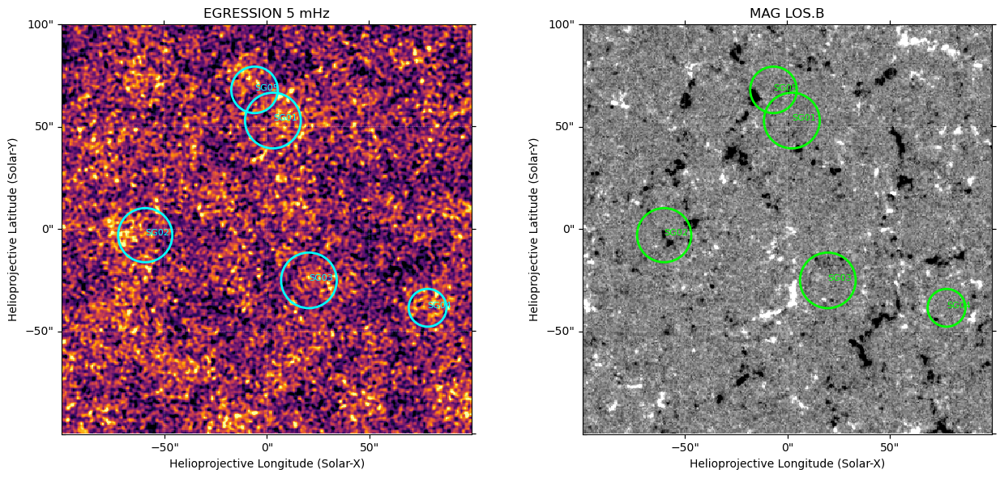

In [116]:
from regions import CircleSkyRegion

circles_world = []
for i, res in enumerate(results):
    if res is None:
        continue
    cx, cy = centers[i]
    xg = cx - half_height + res["xc"]        # centro global (tu misma fórmula)
    yg = cy - half_height + res["yc"]
    center = egr.pixel_to_world(xg*u.pix, yg*u.pix)
    rad = res["r_px"] * np.abs(egr.scale[0].to_value(u.arcsec/u.pix)) * u.arcsec
    circles_world.append((center, rad))

fig = plt.figure(figsize=(13, 6))
for k, (m, col, ti) in enumerate([(egr, "cyan", "EGRESSION POWER at 5 mHz"),
                                  (mag, "lime", "Magnetogram")]):
    ax = fig.add_subplot(1, 2, k+1, projection=m)
    m.plot(axes=ax, cmap=("gray" if k else "inferno"),
           vmin=np.nanpercentile(m.data, 1), vmax=np.nanpercentile(m.data, 99))
    for j, (center, rad) in enumerate(circles_world):
        CircleSkyRegion(center, rad).to_pixel(m.wcs).plot(ax=ax, edgecolor=col,
                                                          facecolor="none", lw=2)
        xp, yp = m.world_to_pixel(center)
        ax.text(xp.value, yp.value, f"SG{j+1:02d}", color=col, fontsize=8)
        ax.set_xlim(x_min_pix.value, x_max_pix.value)
        ax.set_ylim(y_min_pix.value, y_max_pix.value)
    ax.set_title(ti)
plt.tight_layout(); 
plt.show()

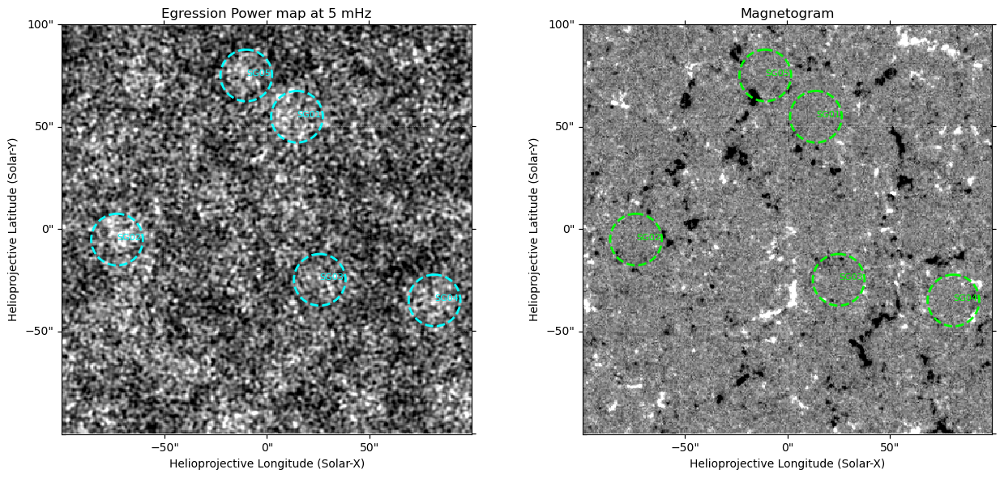

In [125]:
from regions import CircleSkyRegion

R_PIX = 25   # radio fijo en píxeles

# Construir los círculos directamente desde los centroides (sin fit)
circles_world = []
for (cx, cy) in centers:
    center = egr.pixel_to_world(cx*u.pix, cy*u.pix)
    rad = R_PIX * np.abs(egr.scale[0].to_value(u.arcsec/u.pix)) * u.arcsec
    circles_world.append((center, rad))

fig = plt.figure(figsize=(13, 6))
for k, (m, col, ti) in enumerate([(egr, "cyan", "Egression Power map at 5 mHz"),
                                  (mag, "lime", "Magnetogram")]):
    ax = fig.add_subplot(1, 2, k+1, projection=m)
    m.plot(axes=ax, cmap=("gray" if k else "gray"),
           vmin=np.nanpercentile(m.data, 1), vmax=np.nanpercentile(m.data, 99))
    for j, (center, rad) in enumerate(circles_world):
        CircleSkyRegion(center, rad).to_pixel(m.wcs).plot(ax=ax, edgecolor=col,
                                                          facecolor="none", lw=2, linestyle='--')
        xp, yp = m.world_to_pixel(center)
        ax.text(xp.value, yp.value, f"SG{j+1:02d}", color=col, fontsize=8)
        ax.set_xlim(x_min_pix.value, x_max_pix.value)
        ax.set_ylim(y_min_pix.value, y_max_pix.value)
    ax.set_title(ti)
plt.tight_layout()
plt.savefig('Supergranules.png')
plt.show()

ATM cube shape: (778, 33, 116, 126)
Hα -2Å cube shape: (778, 116, 126)
Hα core cube shape: (778, 116, 126)
Hα VLOS cube shape: (778, 116, 126)


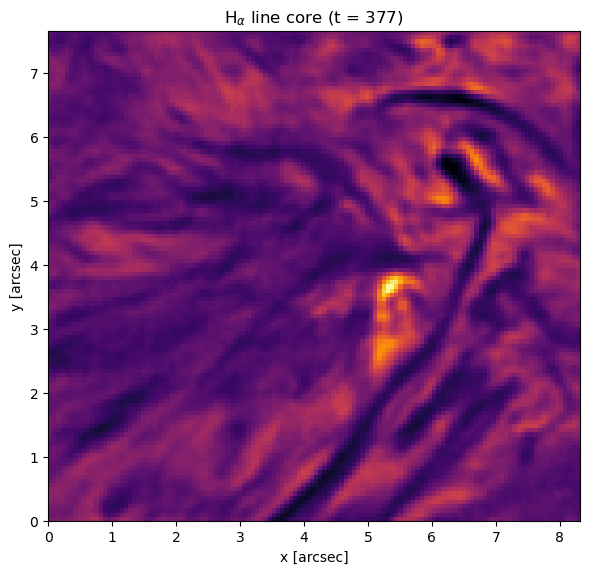

In [115]:
import os
from astropy.io import fits
import numpy as np
import matplotlib.pyplot as plt

# Ruta al archivo FITS del cubo atmosférico / Hα
cwd = os.getcwd()
fits_file = os.path.join(cwd, "all_atm_2comp.fits")

with fits.open(fits_file) as hdul:
    atm_data = hdul[0].data      # shape: (N_time, N_param, ny, nx)
    atm_hdr  = hdul[0].header
    atm_extra = hdul[1].data     # info extra si la necesitas

print("ATM cube shape:", atm_data.shape)

# Índices de los parámetros físicos de interés (como en el otro notebook)
# Hα -2Å, Hα line core, Hα LOS velocity
Q_1, Q_2, Q_3 = 30, 32, 0

ha_minus2   = atm_data[:, Q_1, :, :]  # Hα -2Å
ha_core     = atm_data[:, Q_2, :, :]  # Hα line core
ha_vlos     = atm_data[:, Q_3, :, :]  # Hα LOS velocity

print("Hα -2Å cube shape:", ha_minus2.shape)
print("Hα core cube shape:", ha_core.shape)
print("Hα VLOS cube shape:", ha_vlos.shape)

t_ref = 377
ref_ha_core = ha_core[t_ref]
ref_ha_core = np.fliplr(ref_ha_core)  # misma orientación que el notebook original

pix_scale = 0.066  # arcsec/pix
ny, nx = ref_ha_core.shape

extent = [0, nx * pix_scale, 0, ny * pix_scale]

fig, ax = plt.subplots(figsize=(6, 6))
im = ax.imshow(
    ref_ha_core,
    origin="lower",
    cmap="inferno",
    extent=extent
)

ax.set_xlabel("x [arcsec]")
ax.set_ylabel("y [arcsec]")
ax.set_title(r"H$_\alpha$ line core (t = %d)" % t_ref)

plt.tight_layout()
plt.show()

In [ ]:
pix_scale_ha = 0.066  # arcsec/pix

ny, nx = ref_ha_core.shape  # ny: eje vertical, nx: eje horizontal

width_arcsec  = nx * pix_scale_ha
height_arcsec = ny * pix_scale_ha

print("Shape región en píxeles (ny, nx):", ny, nx)
print("Shape región en arcsec (x, y):", width_arcsec, height_arcsec)

In [ ]:
from astropy.wcs import WCS
from astropy.io import fits

with fits.open(fname) as hdul:
    hdr_hmi=hdul[1].header
    #print(hdr_hmi)
wcs_hmi = WCS(hdr_hmi)
world_center = wcs_hmi.pixel_to_world(j_center_hmi, i_center_hmi)  # Ojo: orden (x=j, y=i)
print(world_center)

In [ ]:
hdr_hmi_orig = hdr_hmi.copy()   # respaldo del header original
wcs_hmi_ref = WCS(hdr_hmi.copy())
hdr_ha = hdr_hmi.copy()         # o mejor: hdr_ha = wcs_ha.to_header()